---
---
---
# CSC8635 Mini-projects
## Introduction

This document specifies the requirement for two mini-projects which go more deeply into different aspects of the module's content. You have to follow **ALL** of these requirements in both mini-projects. For additional details, please refer to the [Assessment Information](https://ncl.instructure.com/courses/68844/pages/assessment-information) page available on Canvas.

The learning objectives of this assignment are:
1. To learn about the design of machine learning analysis pipelines
2. To understand how to select appropriate methods given the dataset type
3. To learn how to conduct machine learning experimentation in a rigorous and effective manner
4. To critically evaluate the performance of the designed machine learning pipelines
5. To learn and practice the skills of reporting machine learning experiments

For this coursework you will be provided with two different datasets:
1. A tabular dataset, defined as a classification problem
2. A tabular dataset, defined as a regression problem

Your job is easy to state: You should design a range of machine learning pipelines appropriate to the nature of each dataset. Overall, we expect that you will perform a thorough investigation involving (whenever relevant) all parts of a machine learning pipeline (exploration, preprocessing, model training, model interpretation and evaluation), evaluating a range of options for all parts of the pipeline and with proper hyperparameter tuning.

You will have to write a short report (within this notebook) that presents the experiments you did, their justification, a detailed description of the performance of your designed pipelines using the most appropriate presentation tools (e.g., tables of results, plots). We expect that you should be able to present your work at a level of detail that would enable a fellow student to reproduce your steps.

## Deliverables
An inline report and code blocks addressing the marking scheme below. The report is expected to have 1000 to 2000 words. The word count excludes references, tables, figures, code blocks and section headers, and has a 10% leeway.

## Marking scheme

- Dataset exploration: 10 marks
- Methods: 30 marks
- Results of analysis: 30 marks
- Discussion: 20 marks
- Presentation (Writing Style, references, figures, etc.): 10 marks

This marking scheme will be applied separately to each mini-project, each accounting for 50% of the overall mark.

Some help for good marks:
- Split your work up into separate code blocks to help the reader understand what you have done.
- Provide text blocks, between code blocks, which help expalin what your code blocks are doing.
- It's not just about applying the first pipeline you find and using default hyperparameters but trying different pipelines and optimising the hyperparameters.
- We expect the solutions that you use to be based on the machine learning techniques you have been taught in the lectures/practicals.
- Note there are marks for presentation, so think about this both for the code, outputs and text you write.

---
---
## Dataset 1: Classification

The dataset, called FARS, is a collection of statistics of US road traffic accidents. The class label (target variable) is about the severity of the accident. It has 20 features and over 100K examples. The dataset can be found in Canvas as a CSV file ("fars.csv"), located alongside this notebook, in which the last column contains the class labels.

## What you need to do:

You will need to perform the following steps on the dataset:
1. EDA
2. Data preprocessing
3. Split the data into training and test sets using cross-validation
4. Develop **FOUR** machine learning pipelines for classifying the severity of the accident
5. Present the results for your pipeline using the most appropriate set of metrics.
6. Provide a short report on which approaches you used and which gave the best results. It would be good to consider why particular pipelines gave the best results.

Some help for good marks:
- We expect that you evaluate a very broad range of options for the design of your machine learning pipelines, including (but not limited to) data preprocessing, feature/instance selection, class imbalance correction, several (appropriate) machine learning pipelines and hyperparameter tuning.


## Your answer below

### Library

In [2]:
# Import Libraries
import time
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport 
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, RandomizedSearchCV, GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import label_binarize, OneHotEncoder, RobustScaler
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, f_classif, SelectFromModel
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, auc, precision_recall_curve

### A. Exploratory Data Analysis (EDA) - (Initial Exploration)

In [3]:
# Load dataset
df_fars = pd.read_csv('fars.csv')

In [4]:
# Generate Initial Report
profile = ProfileReport(df_fars, title='FARS Dataset EDA Initial Report', html={'style':{'full_width':True}})

# Display the report in the notebook
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 30/30 [00:01<00:00, 17.53it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### B. Preprocessing

#### 1. Target Variable Engineering
Simplify target variable into 3 different classes.

1. `Fatal`:
    `Fatal Injury`
2. `Serious`:
    `Incapaciting_Injury`
3. `Minor Injury`:
    `No_Injury`
    `Nonincapaciting_Evident_Injury` 
    `Possible_Injury`
4. Missing or Others (`Died_Prior_to_Accident`, `Injured_Severity_Unknown`, `Unknown`) become `NaN`


In [5]:
# Function to categorize severity
def categorize_severity(val):
    # Fatal Injury
    if val == 'Fatal_Injury':
        return 'Fatal'
    
    # Serious Injury
    elif val == 'Incapaciting_Injury':
        return 'Serious'
    
    # Minor Injury
    elif val in ['No_Injury', 'Nonincapaciting_Evident_Injury', 'Possible_Injury']:
        return 'Minor'
    
    # Missing or Others ('Died_Prior_to_Accident', 'Injured_Severity_Unknown', 'Unknown')
    else:
        return np.nan

# Function Apply
df_fars['TARGET'] = df_fars['INJURY_SEVERITY'].apply(categorize_severity)

# Drop rows with NaN
df_fars_clean = df_fars.dropna(subset=['TARGET']).copy()

# Check New Distribution
print("Target Distribution 3 Classes:")
counts = df_fars_clean['TARGET'].value_counts().sort_index()
print(counts)

Target Distribution 3 Classes:
TARGET
Fatal      42116
Minor      42571
Serious    15072
Name: count, dtype: int64


#### 2. Cleaning Age and Alcohol


In [6]:
# 2 Cleaning Age & Alcohol

# 1. Cleaning Age: 
# The value 99 is suspected invalid age code. Based on the dataset trend, age more than 90 is rare (<0.1%), but age 99 is significantly higher 2552 (2.5%).
# Thus, we will replace age 99 with NaN.
df_fars_clean['AGE'] = df_fars_clean['AGE'].replace({99: np.nan})

# 2. Cleaning Alcohol: 
# Values 0-94 are valid values (BAC in mg/dL)
# Values 96-99 are status codes (Refused/Not Given)
# source : FARS CRSS Coding and Validation Manual (2022)
df_fars_clean['ALCOHOL_TEST_RESULT'] = df_fars_clean['ALCOHOL_TEST_RESULT'].apply(lambda x: 0 if x > 94 else x)

print("Statistics Age after cleaning:")
print(df_fars_clean['AGE'].describe())
print("\nStatistics Alcohol after cleaning:")
print(df_fars_clean['ALCOHOL_TEST_RESULT'].describe())

Statistics Age after cleaning:
count    98048.000000
mean        35.508761
std         19.993613
min          0.000000
25%         20.000000
50%         32.000000
75%         48.000000
max         97.000000
Name: AGE, dtype: float64

Statistics Alcohol after cleaning:
count    99759.000000
mean         1.941068
std          6.069279
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         81.000000
Name: ALCOHOL_TEST_RESULT, dtype: float64


#### 3. Categorical Simplification
1. `PERSON_TYPE`
2. `SEATING_POSITION`
3. `RESTRAINT_SYSTEM-USE`
4. `AIR_BAG_AVAILABILITY/DEPLOYMENT`
5. `NON_MOTORIST_LOCATION`
6. `RELATED_FACTOR_(1)-PERSON_LEVEL`

In [ ]:
# 1. Person Type (10 categories to 4 categories)
def simplify_person(val):
    
    # Group 1: Driver
    if 'Driver' in val: 
        return 'Driver'
    
    # Group 2: Non-Motorist (Pedestrians & Cyclists)
    elif val in ['Pedestrian',
                 'Bicyclist',
                 'Other_Pedestrian',
                 'Other_Cyclist',
                 'Occupant_of_a_Non-Motor_Vehicle_Transport_Device']:
        return 'Non_Motorist'
    
    # Group 3: Passenger
    elif val in ['Passenger_of_a_Motor_Vehicle_in_Transport', 
                 'Occupant_of_a_Motor_Vehicle_Not_in_Transport']:
        return 'Passenger'
    
    # Group 4: Other (Unknown)
    elif val in ['Unknown_Occupant_Type_in_a_Motor_Vehicle_in_Transport', 
                 'Unknown_Type_of_Non-Motorist']:
        return 'Other'

    # Missing -> NaN
    else:
        return np.nan

# 2. Seat Position (26 categories to 5 categories)
def simplify_seating(val):
    val = str(val).lower()

    # Group 1: Driver
    if 'driver' in val: 
        return 'Driver'
    
    # Group 2: Front Passenger
    elif 'front' in val: 
        return 'Front_Passenger'
    
    # Group 3: Back Passenger
    elif 'back' in val or 'rear' in val or 'second' in val or 'third' in val or 'fourth' in val: 
        return 'Back_Passenger'
    
    # Group 4: Non-Motorist
    elif 'non-motorist' in val:
        return 'Non_Motorist'

    # Group 5: Other
    else:
        return 'Other'

# 3. Seatbelt (12 categories to 5 categories)
def simplify_restraint(val):

    # Group 1: No Restraint
    if val in ['None_Used/Not_Applicable']:
        return 'None'
    
    # Group 2: Seatbelt
    elif val in ['Lap_and_Shoulder_Belt',
                 'Lap_Belt',
                 'Shoulder_Belt',
                 'Safety_Belt_Used_Improperly']:
        return 'Seatbelt'
    
    # Group 3: Helmet (Motorcycle & Bicycle)
    elif val in ['Motorcycle_Helmet',
                 'Bicycle_Helmet',
                 'Helmets_Used_Improperly']:
        return 'Helmet'
    
    # Group 4: Child Restraint
    elif val in ['Child_Safety_Seat',
                 'Child_Safety_Seat_Used_Improperly']:
        return 'Child_Restraint'
    
    # Group 5: Unknown
    elif val in ['Unknown',
                 'Restraint_Used_-_Type_Unknown']:
        return 'Unknown'
    
    # Missing -> NaN
    else:
        return np.nan

# 4. Airbag (13 categories to 4 categories)
def simplify_airbag(val):
    
    # Group 1: Deployed
    if val in ['Deployed_Air_Bag_from_Front',
               'Deployed_Air_Bag_Multiple_Directions',
               'Deployed_Air_Bag_from_Side',
               'Deployed_Air_Bag_Direction_Unknown',
               'Deployed_Air_Bag_Other_Direction']:
        return 'Deployed'
    
    # Group 2: Available but Not Deployed
    elif val in ['Air_Bag_Available_but_Not_Deployed_for_this_Seat']:
        return 'Available_Not_Deployed'
    
    # Group 3: Not Applicable / Disabled
    elif val in ['Air_Bag_Not_Available_for_this_Seat',
                 'Non-Motorist',
                 'Air_Bag_Available_and_Switched_Off',
                 'Air_Bag_Disabled_or_Removed',
                 'Air_Bag_Previously_Deployed_and_not_Replaced']:
        return 'Not_Applicable_Disabled'
    
    # Group 4: Unknown/Uncertain
    elif val in ['Air_Bad_Available-Deployment_Not_Known_for_this_Seat',
                 'Unknown_(If_Airbag_Available)']:
        return 'Unknown_Uncertain'
    
    # Missing -> NaN
    else:
        return np.nan

# 5. Non-Motorist Location (18 categories to 4 categories)
def simplify_location(val):
    val = str(val).lower()
    
    # Group 1: Vehicle Occupant (Majority)
    if 'vehicle_occupant' in val:
        return 'Vehicle'
    
    # Group 2: Intersection
    elif 'intersection' in val and 'non-intersection' not in val: 
        # Check 'non-intersection' not in val because there is a category 'Non-Intersection' with a similar name
        return 'Intersection'
    
    # Group 3: Non-Intersection (Straight Road / Shoulder / Others)
    elif 'non-intersection' in val:
        return 'Non_Intersection'
    
    # Other (Unknown)
    else:
        return 'Unknown'

# 6. Related Factor 1 (Take Top 7, others 'Other')
def simplify_related_factor(df_input, top_n=7):
    # Count the top 7 most frequent causes
    top_factors = df_input['RELATED_FACTOR_(1)-PERSON_LEVEL'].value_counts().nlargest(top_n).index.tolist()
    
    # If in Top 7, keep it. If not, replace with 'Other'
    def apply_threshold(val):
        if val in top_factors:
            return val
        else:
            return 'Other_Factor'
            
    return df_input['RELATED_FACTOR_(1)-PERSON_LEVEL'].apply(apply_threshold)

# Apply
df_fars_clean['PERSON_TYPE_SIMPLE'] = df_fars_clean['PERSON_TYPE'].apply(simplify_person)
df_fars_clean['SEATING_SIMPLE'] = df_fars_clean['SEATING_POSITION'].apply(simplify_seating)
df_fars_clean['RESTRAINT_SIMPLE'] = df_fars_clean['RESTRAINT_SYSTEM-USE'].apply(simplify_restraint)
df_fars_clean['AIRBAG_SIMPLE'] = df_fars_clean['AIR_BAG_AVAILABILITY/DEPLOYMENT'].apply(simplify_airbag)
df_fars_clean['LOC_SIMPLE'] = df_fars_clean['NON_MOTORIST_LOCATION'].apply(simplify_location)
df_fars_clean['FACTOR_SIMPLE'] = simplify_related_factor(df_fars_clean, top_n=10)

# Check Unique Values after Simplification
print("Unique Person Types:", df_fars_clean['PERSON_TYPE_SIMPLE'].unique())
print("Unique Seating Positions:", df_fars_clean['SEATING_SIMPLE'].unique())
print("Unique Restraint Systems:", df_fars_clean['RESTRAINT_SIMPLE'].unique())
print("Unique Airbag Status:", df_fars_clean['AIRBAG_SIMPLE'].unique())
print("Unique Non-Motorist Locations:", df_fars_clean['LOC_SIMPLE'].unique())
print("Unique Related Factors:", df_fars_clean['FACTOR_SIMPLE'].unique())

Unique Person Types: ['Driver' 'Passenger' 'Non_Motorist' 'Other']
Unique Seating Positions: ['Driver' 'Front_Passenger' 'Non_Motorist' 'Back_Passenger' 'Other']
Unique Restraint Systems: ['None' 'Seatbelt' 'Helmet' 'Child_Restraint' 'Unknown']
Unique Airbag Status: ['Available_Not_Deployed' 'Deployed' 'Not_Applicable_Disabled'
 'Unknown_Uncertain']
Unique Non-Motorist Locations: ['Vehicle' 'Non_Intersection' 'Intersection' 'Unknown']
Unique Related Factors: ['Not_Applicable_-_Driver/None_-_All_Other_Persons'
 'Walking/Riding_with_or_Against_Traffic_Playing_Working_Sitting_Lying_Standing_etc._in_Roadway'
 'Improper_Crossing_or_Roadway_or_Intersection' 'Unknown'
 'Darting_Stumbling_or_Running_into_Road' 'Other_Factor'
 'Failure_to_Yield_Right_of_Way' 'Not_Visible'
 'Failure_to_Obey_Traffic_Signs_Traffic_Control_Devices_or_Traffic_Officers_Failure_to_Observe_Safety_Zone_Traffic_Laws'
 'Inattentive_(talking_Eating_etc)' 'Interfering_with_Driver']


#### 4. Drop Leakage and Redundant Columns

In [ ]:
# List of Columns to Drop
cols_to_drop = [
    'INJURY_SEVERITY', # Target Original
    
    # DATA LEAKAGE
    'RACE', 'HISPANIC_ORIGIN',      # 'Not_a_Fatality' value leakage
    'TAKEN_TO_HOSPITAL',            # Future information (happens after the accident)
    'EXTRICATION',                  # Future information
    
    # REDUNDANT / TECHNICAL
    'SEATING_POSITION',                 # Replaced by SEATING_SIMPLE
    'RESTRAINT_SYSTEM-USE',             # Replaced by RESTRAINT_SIMPLE
    'AIR_BAG_AVAILABILITY/DEPLOYMENT',  # Replaced by AIRBAG_SIMPLE
    'PERSON_TYPE',                      # Replaced by PERSON_TYPE_SIMPLE
    'NON_MOTORIST_LOCATION',            # Replaced by LOC_SIMPLE
    'EJECTION_PATH',                    # Redundant with EJECTION
    'METHOD_ALCOHOL_DETERMINATION',     # Technical noise
    'ALCOHOL_TEST_TYPE',                # Technical noise
    'METHOD_OF_DRUG_DETERMINATION',     # Technical noise
    'DRUG_TEST_RESULTS_(1_of_3)',       # Possible redundancy with POLICE-REPORTED_DRUG_INVOLVEMENT
    'DRUG_TEST_RESULTS_(2_of_3)',       # Redundant with DRUG_TEST_RESULTS_(1_of_3)
    'DRUG_TEST_RESULTS_(3_of_3)',       # Redundant with DRUG_TEST_RESULTS_(1_of_3)
    'DRUG_TEST_TYPE_(1_of_3)',          # Technical noise
    'DRUG_TEST_TYPE_(2_of_3)',          # Redundant with DRUG_TEST_TYPE_(1_of_3)
    'DRUG_TEST_TYPE_(3_of_3)',          # Redundant with DRUG_TEST_TYPE_(1_of_3)
    'RELATED_FACTOR_(1)-PERSON_LEVEL',  # Replaced by FACTOR_SIMPLE
    'RELATED_FACTOR_(2)-PERSON_LEVEL',  # Redundant with FACTOR_SIMPLE
    'RELATED_FACTOR_(3)-PERSON_LEVEL'   # Redundant with FACTOR_SIMPLE
]

df_fars_final = df_fars_clean.drop(columns=cols_to_drop)

print(f"Final Shape: {df_fars_final.shape}")
print("Final Columns:", df_fars_final.columns.tolist())

df_fars_final.head()

Final Shape: (99759, 14)
Final Columns: ['CASE_STATE', 'AGE', 'SEX', 'EJECTION', 'POLICE_REPORTED_ALCOHOL_INVOLVEMENT', 'ALCOHOL_TEST_RESULT', 'POLICE-REPORTED_DRUG_INVOLVEMENT', 'TARGET', 'PERSON_TYPE_SIMPLE', 'SEATING_SIMPLE', 'RESTRAINT_SIMPLE', 'AIRBAG_SIMPLE', 'LOC_SIMPLE', 'FACTOR_SIMPLE']


,CASE_STATE,AGE,SEX,EJECTION,POLICE_REPORTED_ALCOHOL_INVOLVEMENT,ALCOHOL_TEST_RESULT,POLICE-REPORTED_DRUG_INVOLVEMENT,TARGET,PERSON_TYPE_SIMPLE,SEATING_SIMPLE,RESTRAINT_SIMPLE,AIRBAG_SIMPLE,LOC_SIMPLE,FACTOR_SIMPLE
0,Alabama,34.0,Male,Totally_Ejected,Yes_(Alcohol_Involved),0,Reported_Unknown,Fatal,Driver,Driver,None,Available_Not_Deployed,Vehicle,Not_Applicable_-_Driver/None_-_All_Other_Persons
1,Alabama,20.0,Male,Totally_Ejected,No_(Alcohol_Not_Involved),0,No_Drugs,Fatal,Driver,Driver,None,Deployed,Vehicle,Not_Applicable_-_Driver/None_-_All_Other_Persons
2,Alabama,43.0,Male,Not_Ejected,No_(Alcohol_Not_Involved),0,No_Drugs,Fatal,Driver,Driver,Seatbelt,Not_Applicable_Disabled,Vehicle,Not_Applicable_-_Driver/None_-_All_Other_Persons
3,Alabama,38.0,Female,Not_Ejected,Not_reported,0,Not_Reported,Serious,Passenger,Front_Passenger,Seatbelt,Not_Applicable_Disabled,Vehicle,Not_Applicable_-_Driver/None_-_All_Other_Persons
4,Alabama,50.0,Male,Not_Ejected,Yes_(Alcohol_Involved),0,Reported_Unknown,Fatal,Driver,Driver,Seatbelt,Deployed,Vehicle,Not_Applicable_-_Driver/None_-_All_Other_Persons


### C. EDA Again (Refinement)

In [9]:
# Generate Initial Report
profile = ProfileReport(df_fars_final, title='FARS Dataset EDA Final Report', html={'style':{'full_width':True}})

# Display the report in the notebook
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 14/14 [00:00<00:00, 196.61it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### D. Modelling

#### 1. Train-Test Split with Stratification

In [10]:
# 1. Split Features & Target
X = df_fars_final.drop(columns=['TARGET'])
y = df_fars_final['TARGET']

# 2. Train-Test Split
# define stratify=y for imbalanced datasets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    stratify=y, 
    random_state=42
)

# 3. Verify Dimensions
print(f"Training Set Dimension: {X_train.shape}")
print(f"Test Set Dimension    : {X_test.shape}")

# 4. Check Class Proportions
print("\nClass Proportions in Training Set:")
print(y_train.value_counts(normalize=True))

Training Set Dimension: (79807, 13)
Test Set Dimension    : (19952, 13)

Class Proportions in Training Set:
TARGET
Minor      0.426742
Fatal      0.422181
Serious    0.151077
Name: proportion, dtype: float64


#### 2. Define Preprocessing Transformers

In [11]:
# Automatically detect columns based on data type in X_train
numeric_features = X_train.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = X_train.select_dtypes(include=['object']).columns.tolist()

print(f"Numeric Features ({len(numeric_features)}): {numeric_features}")
print(f"Categorical Features ({len(categorical_features)}): {categorical_features}")

# Numeric Transformer: Median Imputation - Robust Scaling
num_transformer = ImbPipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    #('scaler', StandardScaler())
    ('scaler', RobustScaler())
])

# Categorical Transformer: Mode Imputation - OneHot Encoding
cat_transformer = ImbPipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine both
preprocessor = ColumnTransformer(
    transformers=[
        ('num', num_transformer, numeric_features),
        ('cat', cat_transformer, categorical_features)
    ])

print("preprocessor setup done")

Numeric Features (2): ['AGE', 'ALCOHOL_TEST_RESULT']
Categorical Features (11): ['CASE_STATE', 'SEX', 'EJECTION', 'POLICE_REPORTED_ALCOHOL_INVOLVEMENT', 'POLICE-REPORTED_DRUG_INVOLVEMENT', 'PERSON_TYPE_SIMPLE', 'SEATING_SIMPLE', 'RESTRAINT_SIMPLE', 'AIRBAG_SIMPLE', 'LOC_SIMPLE', 'FACTOR_SIMPLE']
preprocessor setup done


#### 3. Create 4 Pipelines
1. PIPELINE 1: LogReg + Selection + UnderSampling
2. PIPELINE 2: LogReg + SMOTE (All Features)
3. PIPELINE 3: Random Forest + Weighted + RF Selection
4. PIPELINE 4: Random Forest + SMOTE (All Features)

In [ ]:
# PIPELINE 1: LogReg + Selection + UnderSampling
pipeline_1 = ImbPipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif, k=10)), # Select 10 best features
    ('undersampler', RandomUnderSampler(sampling_strategy='majority', random_state=42)),
    ('classifier', LogisticRegression(max_iter=1000, random_state=42))
])

# PIPELINE 2: LogReg + SMOTE (All Features)
pipeline_2 = ImbPipeline([
    ('preprocessor', preprocessor),
    ('smote', SMOTE(random_state=42)),
    ('classifier', LogisticRegression(max_iter=1000, random_state=42))
])

# PIPELINE 3: Random Forest + Weighted + RF Selection 
pipeline_3 = ImbPipeline([
    ('preprocessor', preprocessor),
    # Small RF to select important features
    ('feature_selection', SelectFromModel(RandomForestClassifier(n_estimators=50, random_state=42))), 
    # Class weight 'balanced' replaces the role of SMOTE
    ('classifier', RandomForestClassifier(n_estimators=100, class_weight='balanced', random_state=42))
])

# PIPELINE 4: Random Forest + SMOTE (All Features)
pipeline_4 = ImbPipeline([
    ('preprocessor', preprocessor),
    ('smote', SMOTE(random_state=42)),
    ('classifier', RandomForestClassifier(n_estimators=100, random_state=42))
])

# Collect in a list for easy looping
pipelines = [pipeline_1, pipeline_2, pipeline_3, pipeline_4]
pipeline_names = ["P1: LogReg+Under", "P2: LogReg+SMOTE", "P3: RF+Weighted", "P4: RF+SMOTE"]

print("done pipelines setup")

done pipelines setup


#### 4. Run Stratified 5-Fold Cross-Validation

In [13]:
# List for storing scores and times
results = []
names = []
times = []

# Metric: F1 Macro (fair for imbalanced multiclass)
scoring_metric = 'f1_macro'

print(f"Training 4 Pipelines with 5-Fold CV")
print(f"Evaluation Metric: {scoring_metric}\n")
print("-" * 60)
print(f"{'Pipeline Name':<20} | {'Mean Score':<10} | {'Std Dev':<10} | {'Time (s)':<10}")
print("-" * 60)

for name, model in zip(pipeline_names, pipelines):
    start_time = time.time()
    
    # StratifiedKFold (balanced proportions of Fatal/Serious/Minor classes in each fold)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    
    # Run CV
    #cv_results = cross_val_score(model, X_train, y_train, cv=cv, scoring=scoring_metric, n_jobs=-1) #use all CPU cores
    cv_results = cross_val_score(model, X_train, y_train, cv=cv, scoring=scoring_metric)
    
    end_time = time.time()
    duration = end_time - start_time
    
    # Save results
    results.append(cv_results)
    names.append(name)
    times.append(duration)
    
    print(f"{name:<20} | {cv_results.mean():.4f}     | +-{cv_results.std():.4f}   | {duration:.2f} s")

print("-" * 60)

Training 4 Pipelines with 5-Fold CV
Evaluation Metric: f1_macro

------------------------------------------------------------
Pipeline Name        | Mean Score | Std Dev    | Time (s)  
------------------------------------------------------------
P1: LogReg+Under     | 0.3132     | +-0.0019   | 7.50 s
P2: LogReg+SMOTE     | 0.5737     | +-0.0041   | 107.30 s
P3: RF+Weighted      | 0.5306     | +-0.0031   | 359.75 s
P4: RF+SMOTE         | 0.5317     | +-0.0028   | 783.13 s
------------------------------------------------------------


#### 5. Hyperparameter Tuning 

##### a. Tuning Pipeline 1: LogReg + Selection + Undersampling

In [14]:
# 1. Define Parameter Grid
param_grid = {
    # Number of features to select
    'feature_selection__k': [5, 10, 15],
    # Regularization Strength (higher C = weaker regularization)
    'classifier__C': [0.01, 0.1, 1, 10, 100],
    # Optimization Solver
    'classifier__solver': ['lbfgs', 'newton-cg'],
    # Maximum Iterations
    'classifier__max_iter': [500, 1000, 2500]
}

# 2. Setup GridSearchCV
grid_search_p1 = GridSearchCV(
    estimator=pipeline_1, # Tuning Pipeline 1
    param_grid=param_grid,
    scoring='f1_macro',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
grid_search_p1.fit(X_train, y_train)
end_tune = time.time()

# 4. Display Results
print("Pipeline 1 Tuning Results:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Best Score (F1-Macro): {grid_search_p1.best_score_:.4f}")
print("Best Parameters: ")
print(grid_search_p1.best_params_)

# 5. Save Tuned Model and Score
pipeline_1_tuned = grid_search_p1.best_estimator_
p1_tuned_score = grid_search_p1.best_score_

Pipeline 1 Tuning Results:
Time: 452.88 seconds.
Best Score (F1-Macro): 0.4476
Best Parameters: 
{'classifier__C': 10, 'classifier__max_iter': 500, 'classifier__solver': 'newton-cg', 'feature_selection__k': 15}


##### b. Tuning Pipeline 2: LogReg + SMOTE

In [15]:
# 1. Define Parameter Grid
param_grid = {
    # Regularization Strength (higher C = weaker regularization)
    'classifier__C': [0.01, 0.1, 1, 10, 100],
    # Optimization Solver
    'classifier__solver': ['lbfgs', 'newton-cg'],
    # Maximum Iterations
    'classifier__max_iter': [500, 1000, 2500]
}

# 2. Setup GridSearchCV
grid_search_p2 = GridSearchCV(
    estimator=pipeline_2, # Tuning Pipeline 2
    param_grid=param_grid,
    scoring='f1_macro',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
grid_search_p2.fit(X_train, y_train)
end_tune = time.time()

# 4. Display Results
print("Pipeline 2 Tuning Results:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Best Score (F1-Macro): {grid_search_p2.best_score_:.4f}")
print("Best Parameters: ")
print(grid_search_p2.best_params_)

# 5. Save Tuned Model and Score
pipeline_2_tuned = grid_search_p2.best_estimator_
p2_tuned_score = grid_search_p2.best_score_

Pipeline 2 Tuning Results:
Time: 2562.18 seconds.
Best Score (F1-Macro): 0.5750
Best Parameters: 
{'classifier__C': 10, 'classifier__max_iter': 500, 'classifier__solver': 'lbfgs'}


##### c. Tuning Pipeline 3: Random Forest + Weighted

In [16]:
# 1. Define Parameter Grid
param_dist = {
    # RF Parameters
    'classifier__n_estimators': [50, 100, 200, 300],
    'classifier__max_depth': [10, 20, 30, None],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4],
    'classifier__class_weight': ['balanced', 'balanced_subsample', None]
}

# 2. Setup Randomized Search
random_search_p3 = RandomizedSearchCV(
    estimator=pipeline_3, # Tuning Pipeline 3
    param_distributions=param_dist,
    n_iter=10, # Try 10 random combinations
    scoring='f1_macro',
    cv=5, # Tetap pakai 5-Fold CV
    n_jobs=1,
    random_state=42,
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
random_search_p3.fit(X_train, y_train)
end_tune = time.time()

# 4. Display Best Results
print("Pipeline 3 Tuning Results:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Best Score (F1-Macro): {random_search_p3.best_score_:.4f}")
print("Best Parameters: ")
print(random_search_p3.best_params_)

# 5. Save Tuned Model and Score
pipeline_3_tuned = random_search_p3.best_estimator_
p3_tuned_score = random_search_p3.best_score_

Pipeline 3 Tuning Results:
Time: 5028.10 seconds.
Best Score (F1-Macro): 0.5645
Best Parameters: 
{'classifier__n_estimators': 200, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 4, 'classifier__max_depth': 10, 'classifier__class_weight': 'balanced'}


##### d. Tuning Pipeline 4: Random Forest + SMOTE

In [17]:
# 1. Define Parameter Grid
param_dist = {
    # RF Parameters
    'classifier__n_estimators': [50, 100, 200, 300],
    'classifier__max_depth': [10, 20, 30, None],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4],
    'classifier__class_weight': ['balanced', 'balanced_subsample', None]
}

# 2. Setup Randomized Search
random_search_p4 = RandomizedSearchCV(
    estimator=pipeline_4, # Tuning Pipeline 4
    param_distributions=param_dist,
    n_iter=10, # Try 10 random combinations
    scoring='f1_macro',
    cv=5, # Tetap pakai 5-Fold CV
    n_jobs=1,
    random_state=42
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
random_search_p4.fit(X_train, y_train)
end_tune = time.time()

# 4. Display Best Results
print("Pipeline 4 Tuning Results:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Best Score (F1-Macro): {random_search_p4.best_score_:.4f}")
print("Best Parameters: ")
print(random_search_p4.best_params_)

# 5. Save Tuned Model and Score
pipeline_4_tuned = random_search_p4.best_estimator_
p4_tuned_score = random_search_p4.best_score_

Pipeline 4 Tuning Results:
Time: 4975.51 seconds.
Best Score (F1-Macro): 0.5907
Best Parameters: 
{'classifier__n_estimators': 300, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__max_depth': 20, 'classifier__class_weight': 'balanced_subsample'}


##### e. Comparison Before and After Hyperparameter Tuning

In [18]:
# Compare Before and After Tuning Scores
score_p1 = grid_search_p1.best_score_
score_p2 = grid_search_p2.best_score_
score_p3 = random_search_p3.best_score_
score_p4 = random_search_p4.best_score_

print("\nMacro F1 Score Comparison Before and After Tuning:")
print("-" * 50)
print(f"{'Pipeline Name':<20} | {'Before':<10} | {'After':<10}")
print("-" * 50)
print(f"{pipeline_names[0]:<20} | {results[0].mean():.4f}     | {p1_tuned_score:.4f}")
print(f"{pipeline_names[1]:<20} | {results[1].mean():.4f}     | {p2_tuned_score:.4f}")
print(f"{pipeline_names[2]:<20} | {results[2].mean():.4f}     | {p3_tuned_score:.4f}")
print(f"{pipeline_names[3]:<20} | {results[3].mean():.4f}     | {p4_tuned_score:.4f}")   



Macro F1 Score Comparison Before and After Tuning:
--------------------------------------------------
Pipeline Name        | Before     | After     
--------------------------------------------------
P1: LogReg+Under     | 0.3132     | 0.4476
P2: LogReg+SMOTE     | 0.5737     | 0.5750
P3: RF+Weighted      | 0.5306     | 0.5645
P4: RF+SMOTE         | 0.5317     | 0.5907


### E. Evaluation

#### 1. Compare Algorithms (Boxplot)

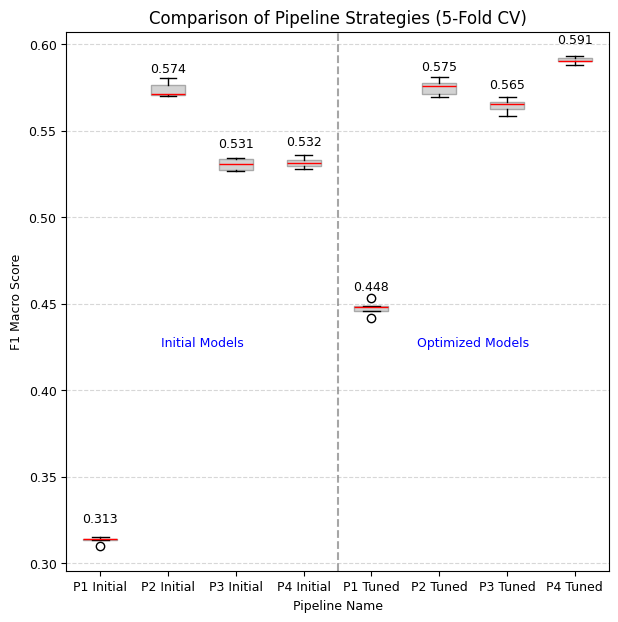

In [19]:
# FINAL EVALUATION ON TEST SET
# Function to get cv scores from search object
def get_cv_scores(search_obj):
    best_idx = search_obj.best_index_
    scores = []
    for i in range(5): # Karena kita pakai 5-Fold
        key = f"split{i}_test_score"
        scores.append(search_obj.cv_results_[key][best_idx])
    return np.array(scores)

# Get cv scores for tuned models
scores_p1_tuned = get_cv_scores(grid_search_p1)
scores_p2_tuned = get_cv_scores(grid_search_p2)
scores_p3_tuned = get_cv_scores(random_search_p3)
scores_p4_tuned = get_cv_scores(random_search_p4)

# Combine all results for plotting
combined_results = results + [scores_p1_tuned, scores_p2_tuned, scores_p3_tuned, scores_p4_tuned]
combined_names = ['P1 Initial', 'P2 Initial', 'P3 Initial', 'P4 Initial', 'P1 Tuned', 'P2 Tuned', 'P3 Tuned', 'P4 Tuned']

# Plotting
plt.figure(figsize=(7, 7))

# Make boxplot
plt.boxplot(combined_results, tick_labels=combined_names, patch_artist=True, 
            boxprops=dict(facecolor='lightgrey', color='darkgrey'),
            medianprops=dict(color='red', linewidth=1))

plt.title('Comparison of Pipeline Strategies (5-Fold CV)')
plt.ylabel('F1 Macro Score', fontsize=9)
plt.xlabel('Pipeline Name', fontsize=9)
plt.yticks(fontsize=9)
plt.xticks(fontsize=9)
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Add mean value annotations
for i, result in enumerate(combined_results):
    mean_val = np.mean(result) # use np.mean for safety
    plt.text(i+1, mean_val + 0.01, f'{mean_val:.3f}', 
             horizontalalignment='center', color='black', fontsize=9)

# Highlight sections
plt.axvline(x=4.5, color='gray', linestyle='--', alpha=0.7)
plt.text(2.5, plt.ylim()[1]*0.7, 'Initial Models', ha='center', fontsize=9, color='blue')
plt.text(6.5, plt.ylim()[1]*0.7, 'Optimized Models', ha='center', fontsize=9, color='blue')

plt.show()

#### 2. Evaluation on Test Set (Confusion Matrix)

Detail Evaluation of P1: LogReg+Under on Test Set

Classification Report:
              precision    recall  f1-score   support

       Fatal       0.54      0.87      0.67      8423
       Minor       0.68      0.44      0.53      8514
     Serious       0.30      0.10      0.15      3015

    accuracy                           0.57     19952
   macro avg       0.51      0.47      0.45     19952
weighted avg       0.57      0.57      0.53     19952



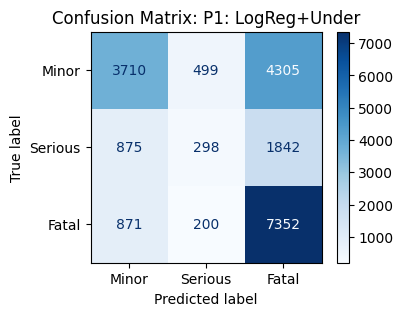

In [20]:
# P1 (Logistic Regression + UnderSampling) Evaluation

print(f"Detail Evaluation of {pipeline_names[0]} on Test Set")

# Retrain model with full training data 
pipeline_1_tuned.fit(X_train, y_train)

# Predict on Test Set
y_pred = pipeline_1_tuned.predict(X_test)

# 1. Print Detailed Metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# 2. Visualize Errors (Confusion Matrix)
# Label order: Minor -> Serious -> Fatal
labels_order = ['Minor', 'Serious', 'Fatal']

fig, ax = plt.subplots(figsize=(4, 3))
cm = confusion_matrix(y_test, y_pred, labels=labels_order)

# Plot Heatmap
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels_order)
disp.plot(cmap='Blues', ax=ax, values_format='d')
plt.title(f'Confusion Matrix: {pipeline_names[0]}')
plt.show()

Detail Evaluation of P2: LogReg+SMOTE on Test Set

Classification Report:
              precision    recall  f1-score   support

       Fatal       0.79      0.61      0.69      8423
       Minor       0.69      0.67      0.68      8514
     Serious       0.28      0.48      0.35      3015

    accuracy                           0.62     19952
   macro avg       0.59      0.59      0.57     19952
weighted avg       0.67      0.62      0.63     19952



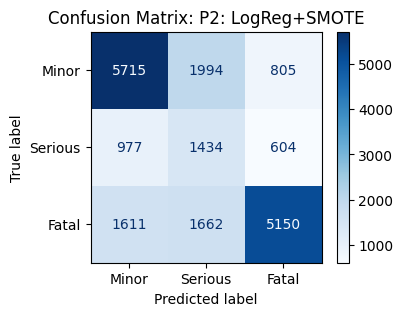

In [21]:
# P2 (Logistic Regression + SMOTE) Evaluation

print(f"Detail Evaluation of {pipeline_names[1]} on Test Set")

# Retrain model with full training data 
pipeline_2_tuned.fit(X_train, y_train)

# Predict on Test Set
y_pred = pipeline_2_tuned.predict(X_test)

# 1. Print Detailed Metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# 2. Visualize Errors (Confusion Matrix)
# Label order: Minor -> Serious -> Fatal
labels_order = ['Minor', 'Serious', 'Fatal']

fig, ax = plt.subplots(figsize=(4, 3))
cm = confusion_matrix(y_test, y_pred, labels=labels_order)

# Plot Heatmap
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels_order)
disp.plot(cmap='Blues', ax=ax, values_format='d')
plt.title(f'Confusion Matrix: {pipeline_names[1]}')
plt.show()

Detail Evaluation of P3: RF+Weighted on Test Set

Classification Report:
              precision    recall  f1-score   support

       Fatal       0.77      0.64      0.70      8423
       Minor       0.67      0.70      0.68      8514
     Serious       0.26      0.35      0.30      3015

    accuracy                           0.62     19952
   macro avg       0.57      0.56      0.56     19952
weighted avg       0.65      0.62      0.63     19952



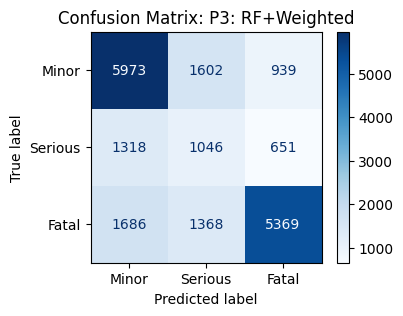

In [22]:
# P3 (Random Forest + Weighted) Evaluation

print(f"Detail Evaluation of {pipeline_names[2]} on Test Set")

# Retrain model with full training data 
pipeline_3_tuned.fit(X_train, y_train)

# Predict on Test Set
y_pred = pipeline_3_tuned.predict(X_test)

# 1. Print Detailed Metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# 2. Visualize Errors (Confusion Matrix)
# Label order: Minor -> Serious -> Fatal
labels_order = ['Minor', 'Serious', 'Fatal']

fig, ax = plt.subplots(figsize=(4, 3))
cm = confusion_matrix(y_test, y_pred, labels=labels_order)

# Plot Heatmap
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels_order)
disp.plot(cmap='Blues', ax=ax, values_format='d')
plt.title(f'Confusion Matrix: {pipeline_names[2]}')
plt.show()

Detail Evaluation of P4: RF+SMOTE on Test Set

Classification Report:
              precision    recall  f1-score   support

       Fatal       0.77      0.67      0.72      8423
       Minor       0.70      0.70      0.70      8514
     Serious       0.31      0.42      0.35      3015

    accuracy                           0.64     19952
   macro avg       0.59      0.60      0.59     19952
weighted avg       0.67      0.64      0.65     19952



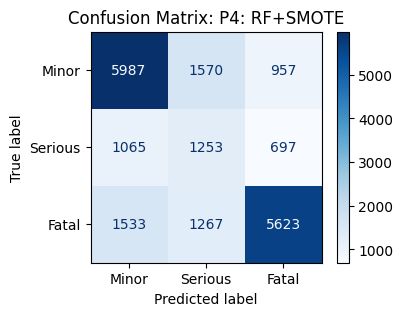

In [23]:
# P4 (Random Forest + SMOTE) Evaluation

print(f"Detail Evaluation of {pipeline_names[3]} on Test Set")

# Retrain model with full training data 
pipeline_4_tuned.fit(X_train, y_train)

# Predict on Test Set
y_pred = pipeline_4_tuned.predict(X_test)

# 1. Print Detailed Metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# 2. Visualize Errors (Confusion Matrix)
# Label order: Minor -> Serious -> Fatal
labels_order = ['Minor', 'Serious', 'Fatal']

fig, ax = plt.subplots(figsize=(4, 3))
cm = confusion_matrix(y_test, y_pred, labels=labels_order)

# Plot Heatmap
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels_order)
disp.plot(cmap='Blues', ax=ax, values_format='d')
plt.title(f'Confusion Matrix: {pipeline_names[3]}')
plt.show()

#### 3. Precision-Recall Curve

['Fatal' 'Minor' 'Serious']


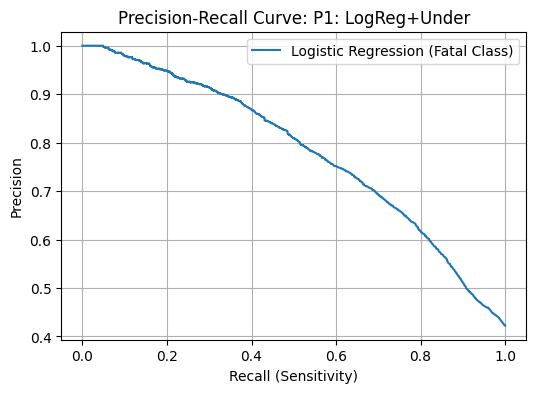

AUPRC score (Fatal Class): 0.7813
At Recall: 0.80, Precision: 0.62
At Recall: 0.38, Precision: 0.88


In [24]:
# Define the best model (P1 - Logistic Regression + UnderSampling)
pipeline_1_tuned.fit(X_train, y_train)

# Predict Probabilities
y_score = pipeline_1_tuned.predict_proba(X_test)

# Check the labels
print(pipeline_1_tuned.classes_) 

# Focus on Fatal, at index 0
# Binarize y_test
y_test_bin = label_binarize(y_test, classes=['Fatal', 'Minor', 'Serious'])
n_classes = y_test_bin.shape[1]

# Plot Curve for FATAL class
precision, recall, _ = precision_recall_curve(y_test_bin[:, 0], y_score[:, 0])

plt.figure(figsize=(6, 4))
plt.plot(recall, precision, label='Logistic Regression (Fatal Class)')
plt.xlabel('Recall (Sensitivity)')
plt.ylabel('Precision')
plt.title(f'Precision-Recall Curve: {pipeline_names[0]}')
plt.legend()
plt.grid()
plt.show()

# Calculate AUPRC
print(f"AUPRC score (Fatal Class): {auc(recall, precision):.4f}")

# Get recall and precision values
precision_at_80 = np.interp(0.80, recall[::-1], precision[::-1])
print(f"At Recall: 0.80, Precision: {precision_at_80:.2f}")

precision_at_38 = np.interp(0.38, recall[::-1], precision[::-1])
print(f"At Recall: 0.38, Precision: {precision_at_38:.2f}")

['Fatal' 'Minor' 'Serious']


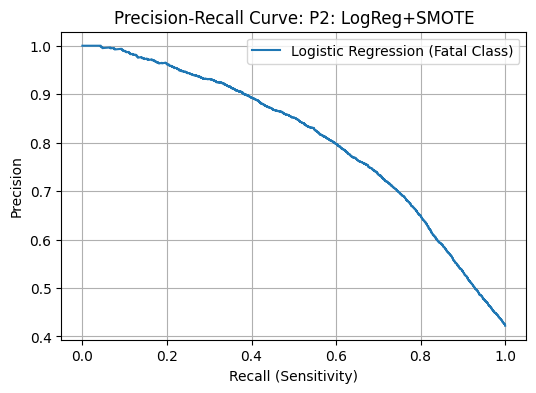

AUPRC score (Fatal Class): 0.8052
At Recall: 0.80, Precision: 0.65
At Recall: 0.38, Precision: 0.90


In [25]:
# Define the best model (P2 - Logistic Regression + SMOTE)
pipeline_2_tuned.fit(X_train, y_train)

# Predict Probabilities
y_score = pipeline_2_tuned.predict_proba(X_test)

# Check the labels
print(pipeline_2_tuned.classes_) 

# Focus on Fatal, at index 0
# Binarize y_test
y_test_bin = label_binarize(y_test, classes=['Fatal', 'Minor', 'Serious'])
n_classes = y_test_bin.shape[1]

# Plot Curve for FATAL class
precision, recall, _ = precision_recall_curve(y_test_bin[:, 0], y_score[:, 0])

plt.figure(figsize=(6, 4))
plt.plot(recall, precision, label='Logistic Regression (Fatal Class)')
plt.xlabel('Recall (Sensitivity)')
plt.ylabel('Precision')
plt.title(f'Precision-Recall Curve: {pipeline_names[1]}')
plt.legend()
plt.grid()
plt.show()

# Calculate AUPRC
print(f"AUPRC score (Fatal Class): {auc(recall, precision):.4f}")

# Get recall and precision values
precision_at_80 = np.interp(0.80, recall[::-1], precision[::-1])
print(f"At Recall: 0.80, Precision: {precision_at_80:.2f}")

precision_at_38 = np.interp(0.38, recall[::-1], precision[::-1])
print(f"At Recall: 0.38, Precision: {precision_at_38:.2f}")

['Fatal' 'Minor' 'Serious']


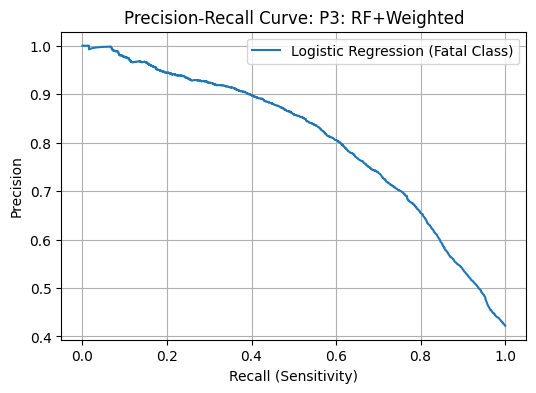

AUPRC score (Fatal Class): 0.8057
At Recall: 0.80, Precision: 0.66
At Recall: 0.38, Precision: 0.90


In [26]:
# Define the best model (P3 - Random Forest + Weighted)
pipeline_3_tuned.fit(X_train, y_train)

# Predict Probabilities
y_score = pipeline_3_tuned.predict_proba(X_test)

# Check the labels
print(pipeline_3_tuned.classes_) 

# Focus on Fatal, at index 0
# Binarize y_test
y_test_bin = label_binarize(y_test, classes=['Fatal', 'Minor', 'Serious'])
n_classes = y_test_bin.shape[1]

# Plot Curve for FATAL class
precision, recall, _ = precision_recall_curve(y_test_bin[:, 0], y_score[:, 0])

plt.figure(figsize=(6, 4))
plt.plot(recall, precision, label='Logistic Regression (Fatal Class)')
plt.xlabel('Recall (Sensitivity)')
plt.ylabel('Precision')
plt.title(f'Precision-Recall Curve: {pipeline_names[2]}')
plt.legend()
plt.grid()
plt.show()

# Calculate AUPRC
print(f"AUPRC score (Fatal Class): {auc(recall, precision):.4f}")

# Get recall and precision values
precision_at_80 = np.interp(0.80, recall[::-1], precision[::-1])
print(f"At Recall: 0.80, Precision: {precision_at_80:.2f}")

precision_at_38 = np.interp(0.38, recall[::-1], precision[::-1])
print(f"At Recall: 0.38, Precision: {precision_at_38:.2f}")

['Fatal' 'Minor' 'Serious']


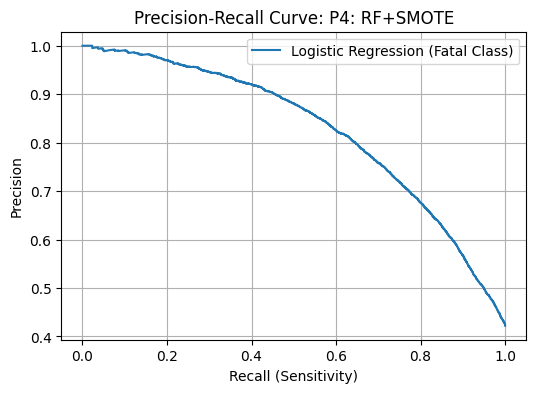

AUPRC score (Fatal Class): 0.8259
At Recall: 0.80, Precision: 0.68
At Recall: 0.38, Precision: 0.92


In [27]:
# Define the best model (P4 - Random Forest + SMOTE)
pipeline_4_tuned.fit(X_train, y_train)

# Predict Probabilities
y_score = pipeline_4_tuned.predict_proba(X_test)

# Check the labels
print(pipeline_4_tuned.classes_) 

# Focus on Fatal, at index 0
# Binarize y_test
y_test_bin = label_binarize(y_test, classes=['Fatal', 'Minor', 'Serious'])
n_classes = y_test_bin.shape[1]

# Plot Curve for FATAL class
precision, recall, _ = precision_recall_curve(y_test_bin[:, 0], y_score[:, 0])

plt.figure(figsize=(6, 4))
plt.plot(recall, precision, label='Logistic Regression (Fatal Class)')
plt.xlabel('Recall (Sensitivity)')
plt.ylabel('Precision')
plt.title(f'Precision-Recall Curve: {pipeline_names[3]}')
plt.legend()
plt.grid()
plt.show()

# Calculate AUPRC
print(f"AUPRC score (Fatal Class): {auc(recall, precision):.4f}")

# Get recall and precision values
precision_at_80 = np.interp(0.80, recall[::-1], precision[::-1])
print(f"At Recall: 0.80, Precision: {precision_at_80:.2f}")

precision_at_38 = np.interp(0.38, recall[::-1], precision[::-1])
print(f"At Recall: 0.38, Precision: {precision_at_38:.2f}")

### **REPORT**

### **Comparative Machine Learning Pipelines for Traffic Accident Severity Prediction**

Name : Fauzi .
<br>Student ID : C5028673

#### **1 Introduction**

##### *1.1 Background*

According to the Federal Highway Administration's Highway Statistics, there were 40,901 deaths in motor vehicle crashes in the United States in 2023 (Federal Highway Administration, 2025). To better understand such incidents, the FARS (Fatality Analysis Reporting System) dataset contains data on traffic crashes in 51 different states in the US. This dataset is then used to predict the crash severity using machine learning models. Predictive analysis using this data helps identify risk factors and develop models that estimate accident severity.

##### *1.2 Objective*

The objective of this coursework is to solve a Multiclass Classification problem. The goal is to predict the severity of injuries in traffic accidents based on various features, such as seating position, airbag deployment, and alcohol involvement.

##### *1.3 Challenges*

Initial exploratory data analysis of the dataset revealed several challenges, such as high cardinality and unknown values. Several categorical variables contain a large number of unique categories. In addition, this dataset contains categories labeled as "Unknown" or code 99. These values may become noise rather than informative ones. 

#### **2 Exploratory Data Analysis (EDA)**

Before applying data preprocessing and modeling techniques, an Exploratory Data Analysis (EDA) was applied to understand the dataset's structure and identify quality issues.

##### *2.1 Data Overview*

The initial profiling of the dataset (summarized in Table 1) reveals a dataset comprising 100,968 observations and 30 variables.

Table 1: Summary of Dataset Statistics (source: pandas-profiling) 
| Metric | Count / Percentage | 
| :--- | :--- | 
| Total Observations | 100,968 | 
| Total Variables | 30 | 
| Variable Types | 24 Categorical, 5 Numeric, 1 Text | 
| Missing Cells | 0 (0.0%) | 
| Duplicate Rows | 4,804 (4.8%) |

The profiling detected 4,804 duplicate rows (4.8%). However, since the dataset lacks a unique 'Person ID', these records likely represent distinct individuals. Therefore, these records were retained.

Standard checks showed 0% null values. However, deeper inspection revealed missing data encoded as specific numeric placeholders. For example, a value of 99 for the variable `AGE` indicates that age is unknown, and values of 96 through 99 for `ALCOHOL_TEST_RESULT` indicate that the test result is unknown, unknown test type, or not reported, rather than being valid test results (NHTSA, 2022).

##### *2.2 Target Variable Analysis*

<img src='graphs\figure1_injury_severity_distribution.png' title='Bar Chart of Raw Injury Severity Distribution' width=500px/>

Figure 1: Distribution of Original Injury Classes (source: pandas-profiling)

The target variable is `INJURY_SEVERITY`, the variable has eight severity levels: `Fatal_Injury`, `No_Injury`, `Incapaciting_Injury`, 
`Nonincapaciting_Evident_Injury`, `Possible_Injury`, `Unknown`, `Injured_Severity_Unknown`, and `Died_Prior_to_Accident`. The `Fatal_Injury` category represents the plurality (41.7%), followed by 'No Injury' (19.8%). Furthermore, the presence of ambiguous labels such as 'Injured_Severity_Unknown' and 'Died_Prior_to_Accident' could create noise. We need to group these categories into three broader categories to create a balanced classification.

##### *2.3 Feature Analysis*

We analyzed all features to identify outliers and high cardinality that necessitate grouping.

##### *2.3.1 Numerical Features*

<img src='graphs\figure2_age_distribution.png' title='Age Distribution' width=500px/>

Figure 2: Age Distribution

<img src='graphs\figure3_alcohol_test_distribution.png' title='Alcohol Test Result Distribution' width=500px/>

Figure 3: Alcohol Test Result Distribution

The distribution of age (`AGE`) and alcohol (`ALCOHOL_TEST_RESULT`) variables highlights a data quality issue. The distribution of age (Figure 2) shows a suspicious spike at the value `99`. Given that the frequency of 99 year olds in accidents is dramatically high compared to 98 or 100, this value is potentially identified as a placeholder for "Unknown". Similarly, the `ALCOHOL_TEST_RESULT` variable contains values higher than 94, which the FARS manual (NHTSA, 2022) defines as status codes (e.g., "Reported as Unknown if Tested") rather than actual Blood Alcohol Concentration (BAC) levels (0-94 g/dL).

##### *2.3.2 Categorical Features*

Several categorical features have high cardinality or an excessive number of unique values, which can lead to feature explosion. The `PERSON_TYPE` and `SEATING_POSITION` features contain 10 and 26 categories each. The feature `RESTRAINT_SYSTEM-USE` contains 12 categories (e.g., `Lap_Belt_Only`, `Shoulder_Belt_Only`, and `Child_Safety_Seat`). The specific type of belt is less significant than the act of wearing one. Furthermore, the feature `AIR_BAG_AVAILABILITY/DEPLOYMENT` combines availability status with deployment direction (Front, Side, Other), resulting in high complexity. The critical information for severity prediction is simply whether the airbag deployed or did not deploy. All of these high cardinality features need to be grouped into broader classes to reduce complexity.

#### **3 Methodology**

##### *3.1 Data Preprocessing*

Building upon the findings in the EDA, a preprocessing was implemented to clean noise and reduce dimensionality.

##### *3.1.1 Target Variable Engineering*

To address the granularity issue, the 8 original injury categories were mapped into three types, adapting the STATS19 framework (DfT, 2021).

- Fatal: Consists of the `Fatal_Injury` category.
- Serious: Consists of the `Incapaciting_Injury` category.
- Minor: Aggregation of `No_Injury`, `Nonincapaciting_Evident_Injury` and `Possible_Injury` categories. 

Records labeled as `Unknown`, `Injured_Severity_Unknown`, and `Died_Prior_to_Accident` were removed (`NaN`). This transformation resulted in a final class distribution of Fatal (42116), Serious (15072), and Minor (42571).

##### *3.1.2 Cleaning Numerical Features*

Data cleaning was applied to numerical features to handle "hidden" missing values identified in Section 2.3.1:

- `AGE` feature: Values of `99` were converted to `NaN`, as `99` serves as a placeholder for unknown age in the FARS system.
- `ALCOHOL_TEST_RESULT` feature: Values between `95` and `99` (Status Codes) were converted to `0`, ensuring the column reflects valid Blood Alcohol Concentration (BAC) levels.

##### *3.1.3 Categorical Feature Simplification*

To prevent the curse of dimensionality caused by high cardinality features (Keogh & Mueen, 2017), we applied  grouping before encoding:

1. Person Type: 10 categories were simplified into Driver, Passenger, Non-Motorist, and Unknown .
2. Seat Position: 26 categories were simplified into only 5 categories (Driver, Front Passenger, Back Passenger, Non-Motorist and Other).
3. Restraint System: 12 detailed equipment classes were grouped into None, Seatbelt, Helmet, Child Restraint, and Unknown.
4. Airbag Availability/Deployment: Complex deployment codes were mapped to Deployed, Available but Not Deployed, Not Applicable/Disabled, and Unknown/Uncertain.
5. Non-Motorist Location: 18 detailed categories were simplified into 4 categories (Vehicle, Intersection, Non-Intersection, and Unknown).
6. Related Factors: Only the top 7 most frequent contributing factors were retained, and other classes were grouped into `Other`.

This preprocessing step could significantly reduce the feature space, improving model training efficiency and reducing the risk of overfitting.

##### *3.1.4 Feature Elimination*

We removed variables based on three criteria, data leakage, redundancy, and irrelevance. Based on the FARS coding manual, `RACE` and `HISPANIC_ORIGIN` often contain values such as "Not a Fatality (Not Applicable)" for survivors. This would allow the model to cheat by checking if demographic data is missing/not applicable to identify non-fatal cases. Also, we dropped `TAKEN_TO_HOSPITAL` and `EXTRICATION` because these variables describe post-crash events.Moreover, as described in Section 3.1.3, we engineered simplified versions of high-cardinality features. To avoid redundancy, the original columns were dropped. 

##### *3.2 Machine Learning Pipelines*

To identify the optimal model, we developed four pipelines to test hypotheses regarding algorithm complexity (linear and non-linear), class balancing techniques, and feature dimensionality.

1. Pipeline 1 : Logistic Regression + Selection + Undersampling.
2. Pipeline 2 : Logistic Regression + SMOTE (All Features).
3. Pipeline 3 : Random Forest Classifier + Weighted + Random Forest Selection.
4. Pipeline 4 : Random Forest Classifier + SMOTE (All Features).

We employed Logistic Regression (LR) and Random Forests (RF) algorithms for this project. AlMamlook et al. (2019) in their study, crash severity was predicted using four machine learning algorithms, including RF, LR, Naive Bayes (NB), and AdaBoost. The results showed that RF and LR performed better than the others with 70% and 69% F1-score. Moreover, in this project, we used the Synthetic Minority Over-sampling Technique (SMOTE) to address class imbalance in datasets (Chawla et al., 2002).

##### *3.3 Validation and Hyperparameter Tuning*

We adopted train-test split, cross-validation, and hyperparameter tuning to ensure the results are robust. The dataset was split into 80% training and 20% test sets. The test set was held out for final evaluation. The 5-Fold Stratified Cross-Validation was also utilized in the training dataset to ensure the same class proportion in every fold. This approach mitigates overfitting and promotes generalizability across different accident scenarios (Khasawneh et al., 2025). Pipeline 1 and 2 with LR were optimized using GridSearchCV. On the other hand, pipeline 3 and 4 were optimized using RandomizedSearchCV to find the optimal parameter.

##### *3.4 Evaluation Metrics*

In this project, we used several evaluation metrics, such as F1-Macro Score, Confusion Matrices, and PR Curve. The F1-Macro Score was utilized as the primary metric. The F1-Macro Score average calculates the F1 Scores independently for each class and then averages them. This ensures that the minority class is treated with equal importance to the majority class (Cho et al., 2023). To diagnose specific misclassification patterns on the test set, we analyzed using Confusion Matrices. Furthermore, we conducted sensitivity analysis on the 'Fatal' class using Precision-Recall (PR) Curves and AUPRC.

#### **4 Results and Discussion**

The preprocessing stage resulted in a final dataset containing 99,759 observations. The data was divided into a Training Set (79,807 rows) and a Test Set (19,952 rows) using the `train_test_split` with stratify parameter. The class proportions of training set were 47.7% Minor, 15.1% Serious, and 42.2% Fatal.

The FARS dataset is dominated by Fatal and Minor outcomes. The Serious class serves as the minority. This imbalance (15% vs 42%) justifies the necessity of the balancing techniques (SMOTE and Class Weighting) applied in Pipelines 2, 3, and 4.

##### *4.1 Hyperparameter Tuning Performance*

To ensure a fair comparison, we evaluated four strategies. Unlike standard approaches that only tune the best initial model, we performed Hyperparameter Tuning on all four pipelines to unlock their maximum potential.

Table 2: Comparison of F1-Macro Scores Before and After Tuning 
| Pipeline Name | Initial Score | Tuned Score | Improvement | Tuning Time | 
| :--- | :--- | :--- | :--- | :--- | 
| P1: LogReg + Undersampling | 0.3132 | 0.4476 | +42.9% | ~452s | 
| P2: LogReg + SMOTE | 0.5737 | 0.5750 | +0.2% | ~2,562s | 
| P3: RF + Weighted | 0.5306 | 0.5645 | +6.4% | ~5,028s | 
| P4: RF + SMOTE | 0.5317 | 0.5907 | +11.1% | ~4,975s |

The pipeline 1 (Logistic Regression with Undersampling) showed the most dramatic improvement (+42.9%). Initially, eliminating the majority class data caused severe information loss. However, tuning the Feature Selection parameter (k=15) significantly improved performance, although it remained the weakest overall. Logistic Regression with SMOTE (P2) started strong (0.573) but showed only a slight improvement after tuning (0.575). This indicates that the model has saturated. 

In contrast, the P4, Random Forest + SMOTE pipeline initially underperformed compared to P2. However, after tuning (increasing depth to 20 and trees to 300), it exceeded the linear model to achieve the highest Macro F1-Score of 0.5907. This confirms that the relationship between accident factors and severity contains non-linear interactions that a tuned tree-based model can capture.

##### *4.2 Comparative Analysis of Pipelines*

Detailed performance is presented in Table 3. It provides a breakdown of performance metrics for each injury class (Fatal, Serious, and Minor).

Table 3: Detailed Class-wise Performance Metrics
| Pipeline | Accuracy | Target Class | Precision | Recall | F1-Score |
| :--- | :--- | :--- | :--- | :--- | :--- | 
| P1 | 0.57 | Fatal | 0.54 | 0.87 | 0.67 |
| | | Serious | 0.30 | 0.10 | 0.15 |
| | | Minor | 0.68 | 0.44 | 0.53 |
| P2 | 0.62 | Fatal | 0.79 | 0.61 | 0.69 |
| | | Serious | 0.28 | 0.48 | 0.35 |
| | | Minor | 0.69 | 0.67 | 0.68 |
| P3 | 0.62 | Fatal | 0.77 |0.64 | 0.70 |
| | | Serious | 0.26 | 0.35 | 0.30 |
| | | Minor | 0.67 | 0.70 | 0.68 |
| P4 | 0.64 | Fatal | 0.77 | 0.67 | 0.72 |
| | | Serious | 0.31 | 0.42 | 0.35 |
| | | Minor | 0.70 | 0.70 | 0.70 |

Pipeline 1 (Logistic Regression + Undersampling) exhibits a unique behavior compared to the other models. It achieved the highest Recall for the Fatal class (0.87), meaning it successfully identified 87% of all fatal accidents. A notable trend is the challenge in classifying the 'Serious' class, as even top models (P2 and P4) only reached a 0.35 F1-Score. This suggests the model struggles to distinguish between the middle class and the extremes.

<img src='graphs\figure4_confusion_matrix_p4.png' title='Confusion Matrix for Pipeline 4' width=300px/>

Figure 4: Confusion Matrix for Pipeline 4

The P4 was chosen as the best model. It achieved the highest Accuracy (0.64) and the highest F1-Scores in both the 'Fatal' (0.72) and 'Minor' (0.70) classes. The model correctly identifies 67% of all fatal accidents and has high precision (0.77). In contrast, performance drops significantly for the middle class (Serious) across all pipelines. For minor injuries, the model shows balanced performance (0.70 precision, recall, and F1-Score), indicating it can distinguish between non-fatal and severe crashes. Random Forest stands out from other classifiers because it can handle noise effectively by randomly selecting variables and data to build multiple classification trees. It works with both discrete and continuous data (AlMamlook et al., 2019).

##### *4.3 Precision-Recall Curve*

We conducted a targeted analysis using the Precision-Recall (PR) Curve for the 'Fatal' class. The graph (Figure 5) demonstrates that the P4 model (Random Forest + SMOTE) maintains good performance for the 'Fatal' class, maintaining high precision (>0.8) up to a recall of approximately 60%.

<img src='graphs\figure5_pr_curve_p4.png' title='Precision-Recall Curves for Pipeline 4 (Fatal Class)' width=400px/>

Figure 5: Precision-Recall Curves for Pipeline 4 (Fatal Class)

Pipeline 4 achieved the highest AUPRC (0.8259), indicating it maintains the best trade-off between detecting fatalities and avoiding false alarms across all threshold levels. If safety policy requires detecting 80% of all fatal accidents or 0.80 Recall, P4 maintains a Precision of 0.68. This is significantly better than P1 with 0.62, meaning P4 produces fewer false alarms. For the most fatal crashes (Recall = 38%), P4 achieves 92% Precision, meaning it is nearly perfect at identifying high probability fatalities.

Table 4: Area Under the Precision-Recall Curve (AUPRC) Metrics for Fatal Class 
| Pipeline | AUPRC Score | Precision at 80% Recall | Precision at 38% Recall | 
| :--- | :--- | :--- | :--- | 
| P1 | 0.7813 | 0.62 | 0.88 | 
| P2 | 0.8052 | 0.65 | 0.90 | 
| P3 | 0.8057 | 0.66 | 0.90 | 
| P4 | 0.8259 | 0.68 | 0.92 |

#### **5 Conclusion and Future Work**

##### *5.1 Conclusion*

This study successfully developed a machine learning pipeline to predict the severity of traffic accidents using the FARS dataset. Of the four pipelines evaluated, Pipeline 4 (Random Forest + SMOTE) performed best, achieving the highest F1-Macro Score of 0.5907. It demonstrated that a non-linear algorithm combined with SMOTE is effective in capturing complex risk factors. With an AUPRC of 0.8259 and a Precision of 92% for high probability cases (38% Recall), the model is highly reliable for prioritizing emergency responses. On the other hand, all models struggled to classify the 'Serious' class (F1-Score ~0.35).

##### *5.2 Future Work*

To overcome limitations and enhance the accuracy, future project could focus on:

1. Treating injury severity as an Ordinal Regression problem (Minor < Serious < Fatal) rather than a nominal classification.
2. Exploring deep learning architectures to potentially capture complex feature interactions.

#### **References**

AlMamlook, R. E., Kwayu, K. M., Alkasisbeh, M. R., & Frefer, A. A. (2019). Comparison of Machine Learning Algorithms for Predicting Traffic Accident Severity. 2019 IEEE Jordan International Joint Conference on Electrical Engineering and Information Technology (JEEIT), 272–276. https://doi.org/10.1109/JEEIT.2019.8717393.

Chawla, N. V., Bowyer, K. W., Hall, L. O., & Kegelmeyer, W. P. (2002). SMOTE: Synthetic minority over-sampling technique. Journal of Artificial Intelligence Research, 16, 321–357. https://doi.org/10.1613/jair.953.

Cho, C. H., Yu, Y. W., & Kim, H. G. (2023). A Study on Dropout Prediction for University Students Using Machine Learning. Applied Sciences (Switzerland), 13(21). https://doi.org/10.3390/app132112004.

Department for Transport. (2021). Guide to severity adjustments for reported road casualty statistics. Retrieved December 25, 2025, from https://www.gov.uk/government/publications/guide-to-severity-adjustments-for-reported-road-casualty-statistics/guide-to-severity-adjustments-for-reported-road-casualties-great-britain.

Federal Highway Administration (FHWA), U.S. Department of Transportation (USDOT). (2025). Highway Statistics, 2023. https://www.fhwa.dot.gov/policyinformation/statistics.cfm.

Keogh, E., Mueen, A. (2017). Curse of Dimensionality. In: Sammut, C., Webb, G.I. (eds) Encyclopedia of Machine Learning and Data Mining. Springer, Boston, MA. https://doi.org/10.1007/978-1-4899-7687-1_192.

Khasawneh, M. A., Umar, I. K., & Khasawneh, A. A. (2025). Explainable artificial intelligence model for accident severity modeling. Asian Journal of Civil Engineering, 26(6), 2433–2445. https://doi.org/10.1007/s42107-025-01318-7.

National Highway Traffic Safety Administration. (2025, February, Revised). 2022 FARS/CRSS coding and validation manual (Report No. DOT HS 813 545).


---
---
## Dataset 2: Regression

In this part of the coursework you are going to look at a regession problem - predicting the growth rate of a bacteria. The provided dataset contains results from a set of experiments where we grew bacteria of different strains and under different conditions (CO2 availability, light, etc..) to compute a growth curve for the bacteria - represented by the variables 'a', 'mu', 'tau' and 'a0'. Your job is to predict the results of the experiment - 'a', 'mu', 'tau' and 'a0' (these are the growth-rate parameters for the bacteria, but you don't need to understand the details to do the coursework).

The dataset is available in Canvas as a CSV file ("fitting-results.csv"), in the same location where you downloaded this notebook.

The CSV contains 9 fields as follows:

| variable | description |
|-----|------|
| n_cyanos | The number of Cyanobacteria available at the start |
| co2 | The amount of CO2 available |
| light | The amount of light available |
| SucRatio | How good the bacteria is at producing sucrose |
| Nsample | Experiment number |
| a | Maximum number of bacteria seen (Target variable) |
| mu | Growth rate of bacteria (Target variable) |
| tau | Time delay before bacteria starts growing (Target variable) |
| a0 | Initial level of bacteria (Target variable) |

## What you need to do:

You will need to perform the following steps on the dataset:
1. EDA
2. Data preprocessing
3. Split the data into train/test/validate
4. Develop **FOUR** machine learning pipelines for predicting 'a', 'mu', 'tau' and 'a0'. This should include hyperparameter tuning. Note: This is not four pipelines one for 'a' one for 'mu'... but four pipelines for 'a', four for 'mu'...
5. Present the results for your pipelines using the most appropriate set of metrics.
6. Provide a short report on which approaches you used and which gave the best results. It would be good to consider why particular pipelines gave the best results.

Some help for good marks:
- Make sure that when you predict 'a' you don't have 'mu', 'tau' or 'a0' in your features - this would make it very easy to predict but be compleatly wrong.
- Remember that this is a **regression** problem and use models that are appropriate for this.
- Hyperparameters can be crucial to get good results here.

## Your answer below

### Library

In [28]:
# Import Libraries
import time
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport 
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV, GridSearchCV
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler, PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score


### A. Exploratory Data Analysis (EDA) - (Initial Exploration)

Load the bacteria dataset ('fitting-results.csv'), located in the same directory of this python notebook.

In [29]:
# Load dataset
df_bacteria = pd.read_csv('fitting-results.csv')

Create an EDA initial report to identify the dataset in details (e.g., missing values, outlier, imbalance data, and feature corelation). 

In [30]:
# Generate Initial Report
profile = ProfileReport(df_bacteria, title='Bacteria Dataset EDA Initial Report', html={'style':{'full_width':True}})

# Display the report in the notebook
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 9/9 [00:00<00:00, 10.37it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In the overview, we have 8 alerts. `co2`, `n_cyanos`, `a`, `a0`, `mu`, and `tau` are highly correlated with minimum 3 other fields. On the other hand, `light` has almost zero correlation with all fields. There are no data imbalance found in features (`n_cyanos`, `co2`, `light`, `SucRatio`) but all the features have different units (need to perform scaler in preprocessor). 

### B. Preprocessing
Based on the initial EDA, we know that:
- `Nsample` feature -> 100% distinct and unique values, we drop this feature.
- `light` feature -> Correlation value almost 0 in every features except itself. But we keep this because it potentially has non-linear correlation. 
- The dataset has no missing data/NaN. We skip dropping NaN or fill NaN with other values (median/mean).
- Standardization will perform later using preprocessor.

In [31]:
# Drop Nsample column
df_bacteria_final = df_bacteria.drop(columns=['Nsample'])

print(f"Final Shape: {df_bacteria_final.shape}")
print("Final Columns:", df_bacteria_final.columns.tolist())

Final Shape: (19992, 8)
Final Columns: ['n_cyanos', 'co2', 'light', 'SucRatio', 'a', 'mu', 'tau', 'a0']


### C. EDA Again (Refinement)
We create the EDA again to make sure the result after finished the preprocessing step.

In [32]:
# Generate Initial Report
profile = ProfileReport(df_bacteria_final, title='Bacteria Dataset EDA Final Report', html={'style':{'full_width':True}})

# Display the report in the notebook
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 8/8 [00:00<00:00, 193.36it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Alerts for `Nsample` disappear after we performed preprocessing to drop `Nsample` column.

### D. Modelling

#### 1. Train-Test-Validate Split
First step in modelling is spliting the data into train, test, dan validate. 
<br>`X` contains `n_cyanos`, `co2`, `light`, and `SucRatio` features. We do not use `a`, `mu`, `tau`, and `a0` as features to predict each other because those will set to targets.
<br>`y` contains `a`, `mu`, `tau`, and `a0` targets.
<br>We split into initial dataset (80%) and testing dataset (20%). Then, the initial dataset are splitted into training dataset (75%) and validation dataset (25%). Finally, we get 60% of training dataset, 20% of validation dataset, and 20% of test dataset. 

In [33]:
# 1. Define Target Variables
target_cols = ['a', 'mu', 'tau', 'a0']

# 2. Split Features & Target
X = df_bacteria_final.drop(columns=target_cols)
y = df_bacteria_final[target_cols]

# 3. Verify Features & Target Dimensions
print(f"Features Dimension: {X.shape}")
print(f"Target Dimension    : {y.shape}")

# 4. First Train-Test Split (80-20)
X_init, X_test, y_init, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42
)

# 5. Second Train-Validation Split (75-25 of 80% -> 60-20-20 overall)
X_train, X_val, y_train, y_val = train_test_split(
    X_init, y_init,
    test_size=0.25,
    random_state=42
)

# 6. Verify Train, Validation & Test Dimensions
print(f"\nTraining Set Dimension: {X_train.shape}")
print(f"Validation Set Dimension: {X_val.shape}")
print(f"Test Set Dimension    : {X_test.shape}")

Features Dimension: (19992, 4)
Target Dimension    : (19992, 4)

Training Set Dimension: (11994, 4)
Validation Set Dimension: (3999, 4)
Test Set Dimension    : (3999, 4)


#### 2. Define Preprocessing Transformers
In this stage, we create 2 preprocessor (basic and advanced). 
<br>The basic preprocessor is used to perform the standard scaler.
<br>The advanced preprocessor is used to create new polynomial features and apply the robust scaler into the features. 

In [34]:
# Define feature columns
feature_cols = ['n_cyanos', 'co2', 'light', 'SucRatio']

print(f"Feature columns ({len(feature_cols)}): {feature_cols}")

# Create basic preprocessor
preprocessor_basic = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), feature_cols)
    ])

# Create more advanced prepocessor
# with Polynomial Features and Robust Scaling
advanced_transformer = Pipeline(steps=[
    ('poly', PolynomialFeatures(degree=2, include_bias=False)), # Create polynomial features
    ('scaler', RobustScaler()) # Scaling using IQR (Robust to outliers)
])

preprocessor_advanced = ColumnTransformer(
    transformers=[
        ('num', advanced_transformer, feature_cols)
    ])

Feature columns (4): ['n_cyanos', 'co2', 'light', 'SucRatio']


#### 3. Create 4 Pipelines
1. PIPELINE 1: Basic Preprocessing (StandardScaler) + **Ridge**
2. PIPELINE 2: Advanced (Poly Features + RobustScaler) + **Ridge** + TransformedTargetRegressor(Log)
3. PIPELINE 3: Basic Preprocessing (StandardScaler) + **Random Forest**
4. PIPELINE 4: Advanced (Poly Features + RobustScaler) + **Random Forest** + TransformedTargetRegressor(Log)

In [35]:
# PIPELINE 1: Basic Preprocessing (StandardScaler) + Ridge
pipeline_1 = Pipeline([
    ('preprocessor', preprocessor_basic),
    ('regressor', Ridge(random_state=42))
])

# PIPELINE 2: Advanced (Poly Features + RobustScaler) + Ridge + TransformedTargetRegressor(Log)
pipeline_2 = Pipeline([
    ('preprocessor', preprocessor_advanced),
    ('regressor', TransformedTargetRegressor(
        regressor=Ridge(random_state=42),
        func=np.log1p,        # Change target to log(y+1)
        inverse_func=np.expm1 # Change prediction back to exp(y)-1 (Original scale)
    ))
])

# PIPELINE 3: Basic Preprocessing (StandardScaler) + Random Forest
pipeline_3 = Pipeline([
    ('preprocessor', preprocessor_basic),
    ('regressor', RandomForestRegressor(n_estimators=100, random_state=42))
])

# PIPELINE 4: Basic Preprocessing (StandardScaler) + Gradient Boosting + TransformedTargetRegressor(Log)
pipeline_4 = Pipeline([
    ('preprocessor', preprocessor_advanced),
    ('regressor', TransformedTargetRegressor(
        regressor=RandomForestRegressor(n_estimators=100, random_state=42),
        func=np.log1p,        # Change target to log(y+1)
        inverse_func=np.expm1 # Change prediction back to exp(y)-1 (Original scale)
    ))
])

# Collect in a list for easy looping
pipelines = [pipeline_1, pipeline_2, pipeline_3, pipeline_4]
pipeline_names = ["P1: Ridge (Base)", "P2: Ridge (Adv+Log)", "P3: RF (Base)", "P4: RF (Adv+Log)"]

#### 4a. Run Target 'a'

In [36]:
# List for storing scores and times
a_val_pred = []
a_val_r2 = []
a_val_rmse = []
a_times = []

# Define target variables
target_col = 'a'

print(f"\nTARGET: {target_col}")
print("-" * 65)

# Target preparation
y_train_col = y_train[target_col]
y_val_col = y_val[target_col]
y_test_col = y_test[target_col]

# Print header
print(f"{'Pipeline':<20} | {'Val R2 Score':<15} | {'Val RMSE':<10}  | {'Time (s)':<10}")
print("-" * 65)

for name, model in zip(pipeline_names, pipelines):
    start_time = time.time()

    # Train on Training Set
    model.fit(X_train, y_train_col)
    
    end_time = time.time()
    duration = end_time - start_time

    # Test on Validation Set
    val_pred = model.predict(X_val)
    
    # Calculate Scores
    val_r2 = r2_score(y_val_col, val_pred)
    val_rmse = np.sqrt(mean_squared_error(y_val_col, val_pred))

    # Save results
    a_val_pred.append(val_pred)
    a_val_r2.append(val_r2)
    a_val_rmse.append(val_rmse)
    a_times.append(duration)
    
    # Print Scores
    print(f"{name:<20} | {val_r2:<15.4f} | {val_rmse:<10.4f}  | {duration:.2f} s")

print("-" * 65)


TARGET: a
-----------------------------------------------------------------
Pipeline             | Val R2 Score    | Val RMSE    | Time (s)  
-----------------------------------------------------------------
P1: Ridge (Base)     | 0.2782          | 12.0295     | 0.02 s
P2: Ridge (Adv+Log)  | 0.6797          | 8.0135      | 0.02 s
P3: RF (Base)        | 0.9781          | 2.0967      | 3.96 s
P4: RF (Adv+Log)     | 0.9720          | 2.3677      | 13.33 s
-----------------------------------------------------------------


##### Hyperparameter Tuning for Target 'a'

In [37]:
# Choose pipeline 1 : Ridge (Base) 
pipeline = pipelines[0]
pipeline_name = pipeline_names[0]
   
# 1. Define parameter grid
param_grid = {
    'regressor__alpha': [1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 
                         1, 5, 10, 20, 30, 
                         35, 40, 45, 50, 55, 100]
}
   
# 2. Setup GridSearchCV
a_grid_search_p1 = GridSearchCV(
    estimator=pipeline, # Tuning Pipeline 1
    param_grid=param_grid,
    scoring='r2',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
a_grid_search_p1.fit(X_train, y_train_col)
end_tune = time.time()

# 4. Save Tuned Model and Score
a_pipeline_1_tuned = a_grid_search_p1.best_estimator_
a_p1_tuned_score = a_grid_search_p1.best_score_

# 5. Model Evaluation (X_test)
test_pred = a_pipeline_1_tuned.predict(X_test)
a_p1_final_r2 = r2_score(y_test_col, test_pred)
a_p1_final_rmse = np.sqrt(mean_squared_error(y_test_col, test_pred))

# 6. Display Results
print(f"\nPipeline 1 Tuning Results for Target {target_col}:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Test R2 Score : {a_p1_final_r2:.4f}")
print(f"Test RMSE     : {a_p1_final_rmse:.4f}")
print("Best Parameters: ")
print(a_grid_search_p1.best_params_)



Pipeline 1 Tuning Results for Target a:
Time: 0.45 seconds.
Test R2 Score : 0.2823
Test RMSE     : 11.6180
Best Parameters: 
{'regressor__alpha': 35}


In [38]:
# Choose pipeline 2 : Ridge (Adv+Log)
pipeline = pipelines[1]
pipeline_name = pipeline_names[1]
   
# 1. Define parameter grid
param_grid = {
    'regressor__regressor__alpha': [1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 
                                    1, 5, 10, 20, 30, 
                                    35, 40, 45, 50, 55, 100]
}
   
# 2. Setup GridSearchCV
a_grid_search_p2 = GridSearchCV(
    estimator=pipeline, # Tuning Pipeline 2
    param_grid=param_grid,
    scoring='r2',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
a_grid_search_p2.fit(X_train, y_train_col)
end_tune = time.time()

# 4. Save Tuned Model and Score
a_pipeline_2_tuned = a_grid_search_p2.best_estimator_
a_p2_tuned_score = a_grid_search_p2.best_score_

# 5. Model Evaluation (X_test)
test_pred = a_pipeline_2_tuned.predict(X_test)
a_p2_final_r2 = r2_score(y_test_col, test_pred)
a_p2_final_rmse = np.sqrt(mean_squared_error(y_test_col, test_pred))

# 6. Display Results
print(f"\nPipeline 2 Tuning Results for Target {target_col}:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Test R2 Score : {a_p2_final_r2:.4f}")
print(f"Test RMSE     : {a_p2_final_rmse:.4f}")
print("Best Parameters: ")
print(a_grid_search_p2.best_params_)



Pipeline 2 Tuning Results for Target a:
Time: 1.43 seconds.
Test R2 Score : 0.6539
Test RMSE     : 8.0679
Best Parameters: 
{'regressor__regressor__alpha': 1e-15}


In [40]:
# Choose pipeline 3 : RF (Base)
pipeline = pipelines[2]
pipeline_name = pipeline_names[2]
   
# 1. Define parameter grid
param_grid = {
    'regressor__n_estimators': [50, 100, 200, 300], 
    'regressor__max_depth': [10, 20, 30, None],
    'regressor__min_samples_leaf': [1, 2, 4]
}
   
# 2. Setup GridSearchCV
a_grid_search_p3 = GridSearchCV(
    estimator=pipeline, # Tuning Pipeline 3
    param_grid=param_grid,
    scoring='r2',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
a_grid_search_p3.fit(X_train, y_train_col)
end_tune = time.time()

# 4. Save Tuned Model and Score
a_pipeline_3_tuned = a_grid_search_p3.best_estimator_
a_p3_tuned_score = a_grid_search_p3.best_score_

# 5. Model Evaluation (X_test)
test_pred = a_pipeline_3_tuned.predict(X_test)
a_p3_final_r2 = r2_score(y_test_col, test_pred)
a_p3_final_rmse = np.sqrt(mean_squared_error(y_test_col, test_pred))

# 6. Display Results
print(f"\nPipeline 3 Tuning Results for Target {target_col}:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Test R2 Score : {a_p3_final_r2:.4f}")
print(f"Test RMSE     : {a_p3_final_rmse:.4f}")
print("Best Parameters: ")
print(a_grid_search_p3.best_params_)


Pipeline 3 Tuning Results for Target a:
Time: 698.89 seconds.
Test R2 Score : 0.9744
Test RMSE     : 2.1963
Best Parameters: 
{'regressor__max_depth': 30, 'regressor__min_samples_leaf': 1, 'regressor__n_estimators': 300}


In [41]:
# Choose pipeline 4 : RF (Adv+Log)
pipeline = pipelines[3]
pipeline_name = pipeline_names[3]
   
# 1. Define parameter grid
param_dist = {
    'regressor__regressor__n_estimators': [50, 100, 200, 300], 
    'regressor__regressor__max_depth': [10, 20, 30, None],
    'regressor__regressor__min_samples_leaf': [1, 2, 4]
}
   
# 2. Setup RandomizedSearchCV
a_grid_search_p4 = RandomizedSearchCV(
    estimator=pipeline, # Tuning Pipeline 4
    param_distributions=param_dist,
    n_iter=10, # Try 10 random combinations
    scoring='r2',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
    random_state=42
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
a_grid_search_p4.fit(X_train, y_train_col)
end_tune = time.time()

# 4. Save Tuned Model and Score
a_pipeline_4_tuned = a_grid_search_p4.best_estimator_
a_p4_tuned_score = a_grid_search_p4.best_score_

# 5. Model Evaluation (X_test)
test_pred = a_pipeline_4_tuned.predict(X_test)
a_p4_final_r2 = r2_score(y_test_col, test_pred)
a_p4_final_rmse = np.sqrt(mean_squared_error(y_test_col, test_pred))

# 6. Display Results
print(f"\nPipeline 4 Tuning Results for Target {target_col}:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Test R2 Score : {a_p4_final_r2:.4f}")
print(f"Test RMSE     : {a_p4_final_rmse:.4f}")
print("Best Parameters: ")
print(a_grid_search_p4.best_params_)


Pipeline 4 Tuning Results for Target a:
Time: 555.72 seconds.
Test R2 Score : 0.9722
Test RMSE     : 2.2868
Best Parameters: 
{'regressor__regressor__n_estimators': 300, 'regressor__regressor__min_samples_leaf': 1, 'regressor__regressor__max_depth': 30}


#### 4b. Run Target 'mu'

In [42]:
# List for storing scores and times
mu_val_pred = []
mu_val_r2 = []
mu_val_rmse = []
mu_times = []

# Define target variables
target_col = 'mu'

print(f"\nTARGET: {target_col}")
print("-" * 65)

# Target preparation
y_train_col = y_train[target_col]
y_val_col = y_val[target_col]
y_test_col = y_test[target_col]

# Print header
print(f"{'Pipeline':<20} | {'Val R2 Score':<15} | {'Val RMSE':<10}  | {'Time (s)':<10}")
print("-" * 65)

for name, model in zip(pipeline_names, pipelines):
    start_time = time.time()

    # Train on Training Set
    model.fit(X_train, y_train_col)
    
    end_time = time.time()
    duration = end_time - start_time

    # Test on Validation Set
    val_pred = model.predict(X_val)
    
    # Calculate Scores
    val_r2 = r2_score(y_val_col, val_pred)
    val_rmse = np.sqrt(mean_squared_error(y_val_col, val_pred))

    # Save results
    mu_val_pred.append(val_pred)
    mu_val_r2.append(val_r2)
    mu_val_rmse.append(val_rmse)
    mu_times.append(duration)
    
    # Print Scores
    print(f"{name:<20} | {val_r2:<15.4f} | {val_rmse:<10.4f}  | {duration:.2f} s")

print("-" * 65)


TARGET: mu
-----------------------------------------------------------------
Pipeline             | Val R2 Score    | Val RMSE    | Time (s)  
-----------------------------------------------------------------
P1: Ridge (Base)     | 0.2894          | 8.8506      | 0.01 s
P2: Ridge (Adv+Log)  | 0.6494          | 6.2167      | 0.02 s
P3: RF (Base)        | 0.9752          | 1.6548      | 2.58 s
P4: RF (Adv+Log)     | 0.9715          | 1.7734      | 9.38 s
-----------------------------------------------------------------


##### Hyperparameter Tuning for Target 'mu'

In [43]:
# Choose pipeline 1 : Ridge (Base) 
pipeline = pipelines[0]
pipeline_name = pipeline_names[0]
   
# 1. Define parameter grid
param_grid = {
    'regressor__alpha': [1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 
                         1, 5, 10, 20, 30, 
                         35, 40, 45, 50, 55, 100]
}
   
# 2. Setup GridSearchCV
mu_grid_search_p1 = GridSearchCV(
    estimator=pipeline, # Tuning Pipeline 1
    param_grid=param_grid,
    scoring='r2',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
mu_grid_search_p1.fit(X_train, y_train_col)
end_tune = time.time()

# 4. Save Tuned Model and Score
mu_pipeline_1_tuned = mu_grid_search_p1.best_estimator_
mu_p1_tuned_score = mu_grid_search_p1.best_score_

# 5. Model Evaluation (X_test)
test_pred = mu_pipeline_1_tuned.predict(X_test)
mu_p1_final_r2 = r2_score(y_test_col, test_pred)
mu_p1_final_rmse = np.sqrt(mean_squared_error(y_test_col, test_pred))

# 6. Display Results
print(f"\nPipeline 1 Tuning Results for Target {target_col}:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Test R2 Score : {mu_p1_final_r2:.4f}")
print(f"Test RMSE     : {mu_p1_final_rmse:.4f}")
print("Best Parameters: ")
print(mu_grid_search_p1.best_params_)



Pipeline 1 Tuning Results for Target mu:
Time: 0.26 seconds.
Test R2 Score : 0.2960
Test RMSE     : 8.4099
Best Parameters: 
{'regressor__alpha': 35}


In [44]:
# Choose pipeline 2 : Ridge (Adv+Log)
pipeline = pipelines[1]
pipeline_name = pipeline_names[1]
   
# 1. Define parameter grid
param_grid = {
    'regressor__regressor__alpha': [1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 
                                    1, 5, 10, 20, 30, 
                                    35, 40, 45, 50, 55, 100]
}
   
# 2. Setup GridSearchCV
mu_grid_search_p2 = GridSearchCV(
    estimator=pipeline, # Tuning Pipeline 2
    param_grid=param_grid,
    scoring='r2',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
mu_grid_search_p2.fit(X_train, y_train_col)
end_tune = time.time()

# 4. Save Tuned Model and Score
mu_pipeline_2_tuned = mu_grid_search_p2.best_estimator_
mu_p2_tuned_score = mu_grid_search_p2.best_score_

# 5. Model Evaluation (X_test)
test_pred = mu_pipeline_2_tuned.predict(X_test)
mu_p2_final_r2 = r2_score(y_test_col, test_pred)
mu_p2_final_rmse = np.sqrt(mean_squared_error(y_test_col, test_pred))

# 6. Display Results
print(f"\nPipeline 2 Tuning Results for Target {target_col}:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Test R2 Score : {mu_p2_final_r2:.4f}")
print(f"Test RMSE     : {mu_p2_final_rmse:.4f}")
print("Best Parameters: ")
print(mu_grid_search_p2.best_params_)



Pipeline 2 Tuning Results for Target mu:
Time: 0.78 seconds.
Test R2 Score : 0.6399
Test RMSE     : 6.0150
Best Parameters: 
{'regressor__regressor__alpha': 1e-15}


In [45]:
# Choose pipeline 3 : RF (Base)
pipeline = pipelines[2]
pipeline_name = pipeline_names[2]
   
# 1. Define parameter grid
param_grid = {
    'regressor__n_estimators': [50, 100, 200, 300], 
    'regressor__max_depth': [10, 20, 30, None],
    'regressor__min_samples_leaf': [1, 2, 4]
}
   
# 2. Setup GridSearchCV
mu_grid_search_p3 = GridSearchCV(
    estimator=pipeline, # Tuning Pipeline 3
    param_grid=param_grid,
    scoring='r2',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
mu_grid_search_p3.fit(X_train, y_train_col)
end_tune = time.time()

# 4. Save Tuned Model and Score
mu_pipeline_3_tuned = mu_grid_search_p3.best_estimator_
mu_p3_tuned_score = mu_grid_search_p3.best_score_

# 5. Model Evaluation (X_test)
test_pred = mu_pipeline_3_tuned.predict(X_test)
mu_p3_final_r2 = r2_score(y_test_col, test_pred)
mu_p3_final_rmse = np.sqrt(mean_squared_error(y_test_col, test_pred))

# 6. Display Results
print(f"\nPipeline 3 Tuning Results for Target {target_col}:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Test R2 Score : {mu_p3_final_r2:.4f}")
print(f"Test RMSE     : {mu_p3_final_rmse:.4f}")
print("Best Parameters: ")
print(mu_grid_search_p3.best_params_)


Pipeline 3 Tuning Results for Target mu:
Time: 832.24 seconds.
Test R2 Score : 0.9720
Test RMSE     : 1.6776
Best Parameters: 
{'regressor__max_depth': 20, 'regressor__min_samples_leaf': 1, 'regressor__n_estimators': 300}


In [46]:
# Choose pipeline 4 : RF (Adv+Log)
pipeline = pipelines[3]
pipeline_name = pipeline_names[3]
   
# 1. Define parameter grid
param_dist = {
    'regressor__regressor__n_estimators': [50, 100, 200, 300], 
    'regressor__regressor__max_depth': [10, 20, 30, None],
    'regressor__regressor__min_samples_leaf': [1, 2, 4]
}
   
# 2. Setup RandomizedSearchCV
mu_grid_search_p4 = RandomizedSearchCV(
    estimator=pipeline, # Tuning Pipeline 4
    param_distributions=param_dist,
    n_iter=10, # Try 10 random combinations
    scoring='r2',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
    random_state=42
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
mu_grid_search_p4.fit(X_train, y_train_col)
end_tune = time.time()

# 4. Save Tuned Model and Score
mu_pipeline_4_tuned = mu_grid_search_p4.best_estimator_
mu_p4_tuned_score = mu_grid_search_p4.best_score_

# 5. Model Evaluation (X_test)
test_pred = mu_pipeline_4_tuned.predict(X_test)
mu_p4_final_r2 = r2_score(y_test_col, test_pred)
mu_p4_final_rmse = np.sqrt(mean_squared_error(y_test_col, test_pred))

# 6. Display Results
print(f"\nPipeline 4 Tuning Results for Target {target_col}:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Test R2 Score : {mu_p4_final_r2:.4f}")
print(f"Test RMSE     : {mu_p4_final_rmse:.4f}")
print("Best Parameters: ")
print(mu_grid_search_p4.best_params_)


Pipeline 4 Tuning Results for Target mu:
Time: 719.73 seconds.
Test R2 Score : 0.9704
Test RMSE     : 1.7251
Best Parameters: 
{'regressor__regressor__n_estimators': 200, 'regressor__regressor__min_samples_leaf': 1, 'regressor__regressor__max_depth': 30}


#### 4c. Run Target 'tau'

In [47]:
# List for storing scores and times
tau_val_pred = []
tau_val_r2 = []
tau_val_rmse = []
tau_times = []

# Define target variables
target_col = 'tau'


print(f"\nTARGET: {target_col}")
print("-" * 65)

# Target preparation
y_train_col = y_train[target_col]
y_val_col = y_val[target_col]
y_test_col = y_test[target_col]

# Print header
print(f"{'Pipeline':<20} | {'Val R2 Score':<15} | {'Val RMSE':<10}  | {'Time (s)':<10}")
print("-" * 65)

for name, model in zip(pipeline_names, pipelines):
    start_time = time.time()

    # Train on Training Set
    model.fit(X_train, y_train_col)
    
    end_time = time.time()
    duration = end_time - start_time

    # Test on Validation Set
    val_pred = model.predict(X_val)
    
    # Calculate Scores
    val_r2 = r2_score(y_val_col, val_pred)
    val_rmse = np.sqrt(mean_squared_error(y_val_col, val_pred))

    # Save results
    tau_val_pred.append(val_pred)
    tau_val_r2.append(val_r2)
    tau_val_rmse.append(val_rmse)
    tau_times.append(duration)
    
    # Print Scores
    print(f"{name:<20} | {val_r2:<15.4f} | {val_rmse:<10.4f}  | {duration:.2f} s")

print("-" * 65)


TARGET: tau
-----------------------------------------------------------------
Pipeline             | Val R2 Score    | Val RMSE    | Time (s)  
-----------------------------------------------------------------
P1: Ridge (Base)     | 0.6270          | 0.2601      | 0.00 s
P2: Ridge (Adv+Log)  | 0.8727          | 0.1520      | 0.01 s
P3: RF (Base)        | 0.9944          | 0.0320      | 2.34 s
P4: RF (Adv+Log)     | 0.9941          | 0.0328      | 8.88 s
-----------------------------------------------------------------


##### Hyperparameter Tuning for Target 'mu'

In [48]:
# Choose pipeline 1 : Ridge (Base) 
pipeline = pipelines[0]
pipeline_name = pipeline_names[0]
   
# 1. Define parameter grid
param_grid = {
    'regressor__alpha': [1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 
                         1, 5, 10, 20, 30, 
                         35, 40, 45, 50, 55, 100]
}
   
# 2. Setup GridSearchCV
tau_grid_search_p1 = GridSearchCV(
    estimator=pipeline, # Tuning Pipeline 1
    param_grid=param_grid,
    scoring='r2',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
tau_grid_search_p1.fit(X_train, y_train_col)
end_tune = time.time()

# 4. Save Tuned Model and Score
tau_pipeline_1_tuned = tau_grid_search_p1.best_estimator_
tau_p1_tuned_score = tau_grid_search_p1.best_score_

# 5. Model Evaluation (X_test)
test_pred = tau_pipeline_1_tuned.predict(X_test)
tau_p1_final_r2 = r2_score(y_test_col, test_pred)
tau_p1_final_rmse = np.sqrt(mean_squared_error(y_test_col, test_pred))

# 6. Display Results
print(f"\nPipeline 1 Tuning Results for Target {target_col}:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Test R2 Score : {tau_p1_final_r2:.4f}")
print(f"Test RMSE     : {tau_p1_final_rmse:.4f}")
print("Best Parameters: ")
print(tau_grid_search_p1.best_params_)



Pipeline 1 Tuning Results for Target tau:
Time: 0.25 seconds.
Test R2 Score : 0.6218
Test RMSE     : 0.2615
Best Parameters: 
{'regressor__alpha': 10}


In [49]:
# Choose pipeline 2 : Ridge (Adv+Log)
pipeline = pipelines[1]
pipeline_name = pipeline_names[1]
   
# 1. Define parameter grid
param_grid = {
    'regressor__regressor__alpha': [1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 
                                    1, 5, 10, 20, 30, 
                                    35, 40, 45, 50, 55, 100]
}
   
# 2. Setup GridSearchCV
tau_grid_search_p2 = GridSearchCV(
    estimator=pipeline, # Tuning Pipeline 2
    param_grid=param_grid,
    scoring='r2',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
tau_grid_search_p2.fit(X_train, y_train_col)
end_tune = time.time()

# 4. Save Tuned Model and Score
tau_pipeline_2_tuned = tau_grid_search_p2.best_estimator_
tau_p2_tuned_score = tau_grid_search_p2.best_score_

# 5. Model Evaluation (X_test)
test_pred = tau_pipeline_2_tuned.predict(X_test)
tau_p2_final_r2 = r2_score(y_test_col, test_pred)
tau_p2_final_rmse = np.sqrt(mean_squared_error(y_test_col, test_pred))

# 6. Display Results
print(f"\nPipeline 2 Tuning Results for Target {target_col}:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Test R2 Score : {tau_p2_final_r2:.4f}")
print(f"Test RMSE     : {tau_p2_final_rmse:.4f}")
print("Best Parameters: ")
print(tau_grid_search_p2.best_params_)



Pipeline 2 Tuning Results for Target tau:
Time: 0.80 seconds.
Test R2 Score : 0.8620
Test RMSE     : 0.1580
Best Parameters: 
{'regressor__regressor__alpha': 1e-15}


In [50]:
# Choose pipeline 3 : RF (Base)
pipeline = pipelines[2]
pipeline_name = pipeline_names[2]
   
# 1. Define parameter grid
param_grid = {
    'regressor__n_estimators': [50, 100, 200, 300], 
    'regressor__max_depth': [10, 20, 30, None],
    'regressor__min_samples_leaf': [1, 2, 4]
}
   
# 2. Setup GridSearchCV
tau_grid_search_p3 = GridSearchCV(
    estimator=pipeline, # Tuning Pipeline 3
    param_grid=param_grid,
    scoring='r2',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
tau_grid_search_p3.fit(X_train, y_train_col)
end_tune = time.time()

# 4. Save Tuned Model and Score
tau_pipeline_3_tuned = tau_grid_search_p3.best_estimator_
tau_p3_tuned_score = tau_grid_search_p3.best_score_

# 5. Model Evaluation (X_test)
test_pred = tau_pipeline_3_tuned.predict(X_test)
tau_p3_final_r2 = r2_score(y_test_col, test_pred)
tau_p3_final_rmse = np.sqrt(mean_squared_error(y_test_col, test_pred))

# 6. Display Results
print(f"\nPipeline 3 Tuning Results for Target {target_col}:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Test R2 Score : {tau_p3_final_r2:.4f}")
print(f"Test RMSE     : {tau_p3_final_rmse:.4f}")
print("Best Parameters: ")
print(tau_grid_search_p3.best_params_)


Pipeline 3 Tuning Results for Target tau:
Time: 685.94 seconds.
Test R2 Score : 0.9918
Test RMSE     : 0.0386
Best Parameters: 
{'regressor__max_depth': 20, 'regressor__min_samples_leaf': 1, 'regressor__n_estimators': 300}


In [51]:
# Choose pipeline 4 : RF (Adv+Log)
pipeline = pipelines[3]
pipeline_name = pipeline_names[3]
   
# 1. Define parameter grid
param_dist = {
    'regressor__regressor__n_estimators': [50, 100, 200, 300], 
    'regressor__regressor__max_depth': [10, 20, 30, None],
    'regressor__regressor__min_samples_leaf': [1, 2, 4]
}
   
# 2. Setup RandomizedSearchCV
tau_grid_search_p4 = RandomizedSearchCV(
    estimator=pipeline, # Tuning Pipeline 4
    param_distributions=param_dist,
    n_iter=10, # Try 10 random combinations
    scoring='r2',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
    random_state=42
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
tau_grid_search_p4.fit(X_train, y_train_col)
end_tune = time.time()

# 4. Save Tuned Model and Score
tau_pipeline_4_tuned = tau_grid_search_p4.best_estimator_
tau_p4_tuned_score = tau_grid_search_p4.best_score_

# 5. Model Evaluation (X_test)
test_pred = tau_pipeline_4_tuned.predict(X_test)
tau_p4_final_r2 = r2_score(y_test_col, test_pred)
tau_p4_final_rmse = np.sqrt(mean_squared_error(y_test_col, test_pred))

# 6. Display Results
print(f"\nPipeline 4 Tuning Results for Target {target_col}:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Test R2 Score : {tau_p4_final_r2:.4f}")
print(f"Test RMSE     : {tau_p4_final_rmse:.4f}")
print("Best Parameters: ")
print(tau_grid_search_p4.best_params_)


Pipeline 4 Tuning Results for Target tau:
Time: 599.23 seconds.
Test R2 Score : 0.9919
Test RMSE     : 0.0383
Best Parameters: 
{'regressor__regressor__n_estimators': 300, 'regressor__regressor__min_samples_leaf': 1, 'regressor__regressor__max_depth': 30}


#### 4d. Run Target 'a0'

In [52]:
# List for storing scores and times
a0_val_pred = []
a0_val_r2 = []
a0_val_rmse = []
a0_times = []

# Define target variables
target_col = 'a0'


print(f"\nTARGET: {target_col}")
print("-" * 65)

# Target preparation
y_train_col = y_train[target_col]
y_val_col = y_val[target_col]
y_test_col = y_test[target_col]

# Print header
print(f"{'Pipeline':<20} | {'Val R2 Score':<15} | {'Val RMSE':<10}  | {'Time (s)':<10}")
print("-" * 65)

for name, model in zip(pipeline_names, pipelines):
    start_time = time.time()

    # Train on Training Set
    model.fit(X_train, y_train_col)
    
    end_time = time.time()
    duration = end_time - start_time

    # Test on Validation Set
    val_pred = model.predict(X_val)
    
    # Calculate Scores
    val_r2 = r2_score(y_val_col, val_pred)
    val_rmse = np.sqrt(mean_squared_error(y_val_col, val_pred))

    # Save results
    a0_val_pred.append(val_pred)
    a0_val_r2.append(val_r2)
    a0_val_rmse.append(val_rmse)
    a0_times.append(duration)
    
    # Print Scores
    print(f"{name:<20} | {val_r2:<15.4f} | {val_rmse:<10.4f}  | {duration:.2f} s")

print("-" * 65)


TARGET: a0
-----------------------------------------------------------------
Pipeline             | Val R2 Score    | Val RMSE    | Time (s)  
-----------------------------------------------------------------
P1: Ridge (Base)     | 0.2071          | 0.0151      | 0.00 s
P2: Ridge (Adv+Log)  | 0.2312          | 0.0149      | 0.01 s
P3: RF (Base)        | 0.6907          | 0.0094      | 1.46 s
P4: RF (Adv+Log)     | 0.7066          | 0.0092      | 5.90 s
-----------------------------------------------------------------


##### Hyperparameter Tuning for Target 'mu'

In [53]:
# Choose pipeline 1 : Ridge (Base) 
pipeline = pipelines[0]
pipeline_name = pipeline_names[0]
   
# 1. Define parameter grid
param_grid = {
    'regressor__alpha': [1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 
                         1, 5, 10, 20, 30, 
                         35, 40, 45, 50, 55, 100]
}
   
# 2. Setup GridSearchCV
a0_grid_search_p1 = GridSearchCV(
    estimator=pipeline, # Tuning Pipeline 1
    param_grid=param_grid,
    scoring='r2',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
a0_grid_search_p1.fit(X_train, y_train_col)
end_tune = time.time()

# 4. Save Tuned Model and Score
a0_pipeline_1_tuned = a0_grid_search_p1.best_estimator_
a0_p1_tuned_score = a0_grid_search_p1.best_score_

# 5. Model Evaluation (X_test)
test_pred = a0_pipeline_1_tuned.predict(X_test)
a0_p1_final_r2 = r2_score(y_test_col, test_pred)
a0_p1_final_rmse = np.sqrt(mean_squared_error(y_test_col, test_pred))

# 6. Display Results
print(f"\nPipeline 1 Tuning Results for Target {target_col}:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Test R2 Score : {a0_p1_final_r2:.4f}")
print(f"Test RMSE     : {a0_p1_final_rmse:.4f}")
print("Best Parameters: ")
print(a0_grid_search_p1.best_params_)



Pipeline 1 Tuning Results for Target a0:
Time: 0.30 seconds.
Test R2 Score : 0.2148
Test RMSE     : 0.0153
Best Parameters: 
{'regressor__alpha': 10}


In [54]:
# Choose pipeline 2 : Ridge (Adv+Log)
pipeline = pipelines[1]
pipeline_name = pipeline_names[1]
   
# 1. Define parameter grid
param_grid = {
    'regressor__regressor__alpha': [1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 
                                    1, 5, 10, 20, 30, 
                                    35, 40, 45, 50, 55, 100]
}
   
# 2. Setup GridSearchCV
a0_grid_search_p2 = GridSearchCV(
    estimator=pipeline, # Tuning Pipeline 2
    param_grid=param_grid,
    scoring='r2',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
a0_grid_search_p2.fit(X_train, y_train_col)
end_tune = time.time()

# 4. Save Tuned Model and Score
a0_pipeline_2_tuned = a0_grid_search_p2.best_estimator_
a0_p2_tuned_score = a0_grid_search_p2.best_score_

# 5. Model Evaluation (X_test)
test_pred = a0_pipeline_2_tuned.predict(X_test)
a0_p2_final_r2 = r2_score(y_test_col, test_pred)
a0_p2_final_rmse = np.sqrt(mean_squared_error(y_test_col, test_pred))

# 6. Display Results
print(f"\nPipeline 2 Tuning Results for Target {target_col}:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Test R2 Score : {a0_p2_final_r2:.4f}")
print(f"Test RMSE     : {a0_p2_final_rmse:.4f}")
print("Best Parameters: ")
print(a0_grid_search_p2.best_params_)



Pipeline 2 Tuning Results for Target a0:
Time: 0.96 seconds.
Test R2 Score : 0.2418
Test RMSE     : 0.0150
Best Parameters: 
{'regressor__regressor__alpha': 30}


In [55]:
# Choose pipeline 3 : RF (Base)
pipeline = pipelines[2]
pipeline_name = pipeline_names[2]
   
# 1. Define parameter grid
param_grid = {
    'regressor__n_estimators': [50, 100, 200, 300], 
    'regressor__max_depth': [10, 20, 30, None],
    'regressor__min_samples_leaf': [1, 2, 4]
}
   
# 2. Setup GridSearchCV
a0_grid_search_p3 = GridSearchCV(
    estimator=pipeline, # Tuning Pipeline 3
    param_grid=param_grid,
    scoring='r2',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
a0_grid_search_p3.fit(X_train, y_train_col)
end_tune = time.time()

# 4. Save Tuned Model and Score
a0_pipeline_3_tuned = a0_grid_search_p3.best_estimator_
a0_p3_tuned_score = a0_grid_search_p3.best_score_

# 5. Model Evaluation (X_test)
test_pred = a0_pipeline_3_tuned.predict(X_test)
a0_p3_final_r2 = r2_score(y_test_col, test_pred)
a0_p3_final_rmse = np.sqrt(mean_squared_error(y_test_col, test_pred))

# 6. Display Results
print(f"\nPipeline 3 Tuning Results for Target {target_col}:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Test R2 Score : {a0_p3_final_r2:.4f}")
print(f"Test RMSE     : {a0_p3_final_rmse:.4f}")
print("Best Parameters: ")
print(a0_grid_search_p3.best_params_)


Pipeline 3 Tuning Results for Target a0:
Time: 447.95 seconds.
Test R2 Score : 0.6932
Test RMSE     : 0.0095
Best Parameters: 
{'regressor__max_depth': 20, 'regressor__min_samples_leaf': 4, 'regressor__n_estimators': 300}


In [56]:
# Choose pipeline 4 : RF (Adv+Log)
pipeline = pipelines[3]
pipeline_name = pipeline_names[3]
   
# 1. Define parameter grid
param_dist = {
    'regressor__regressor__n_estimators': [50, 100, 200, 300], 
    'regressor__regressor__max_depth': [10, 20, 30, None],
    'regressor__regressor__min_samples_leaf': [1, 2, 4]
}
   
# 2. Setup RandomizedSearchCV
a0_grid_search_p4 = RandomizedSearchCV(
    estimator=pipeline, # Tuning Pipeline 4
    param_distributions=param_dist,
    n_iter=10, # Try 10 random combinations
    scoring='r2',
    cv=5, # 5-Fold Stratified CV
    n_jobs=1,
    random_state=42
)

# 3. Perform Training (Only on X_train)
start_tune = time.time()
a0_grid_search_p4.fit(X_train, y_train_col)
end_tune = time.time()

# 4. Save Tuned Model and Score
a0_pipeline_4_tuned = a0_grid_search_p4.best_estimator_
a0_p4_tuned_score = a0_grid_search_p4.best_score_

# 5. Model Evaluation (X_test)
test_pred = a0_pipeline_4_tuned.predict(X_test)
a0_p4_final_r2 = r2_score(y_test_col, test_pred)
a0_p4_final_rmse = np.sqrt(mean_squared_error(y_test_col, test_pred))

# 6. Display Results
print(f"\nPipeline 4 Tuning Results for Target {target_col}:")
print(f"Time: {end_tune - start_tune:.2f} seconds.")
print(f"Test R2 Score : {a0_p4_final_r2:.4f}")
print(f"Test RMSE     : {a0_p4_final_rmse:.4f}")
print("Best Parameters: ")
print(a0_grid_search_p4.best_params_)


Pipeline 4 Tuning Results for Target a0:
Time: 455.23 seconds.
Test R2 Score : 0.7271
Test RMSE     : 0.0090
Best Parameters: 
{'regressor__regressor__n_estimators': 300, 'regressor__regressor__min_samples_leaf': 2, 'regressor__regressor__max_depth': 20}


### E. Evaluation

#### 1. Compare Pipelines per Target

Processing target: a
Processing target: mu
Processing target: tau
Processing target: a0


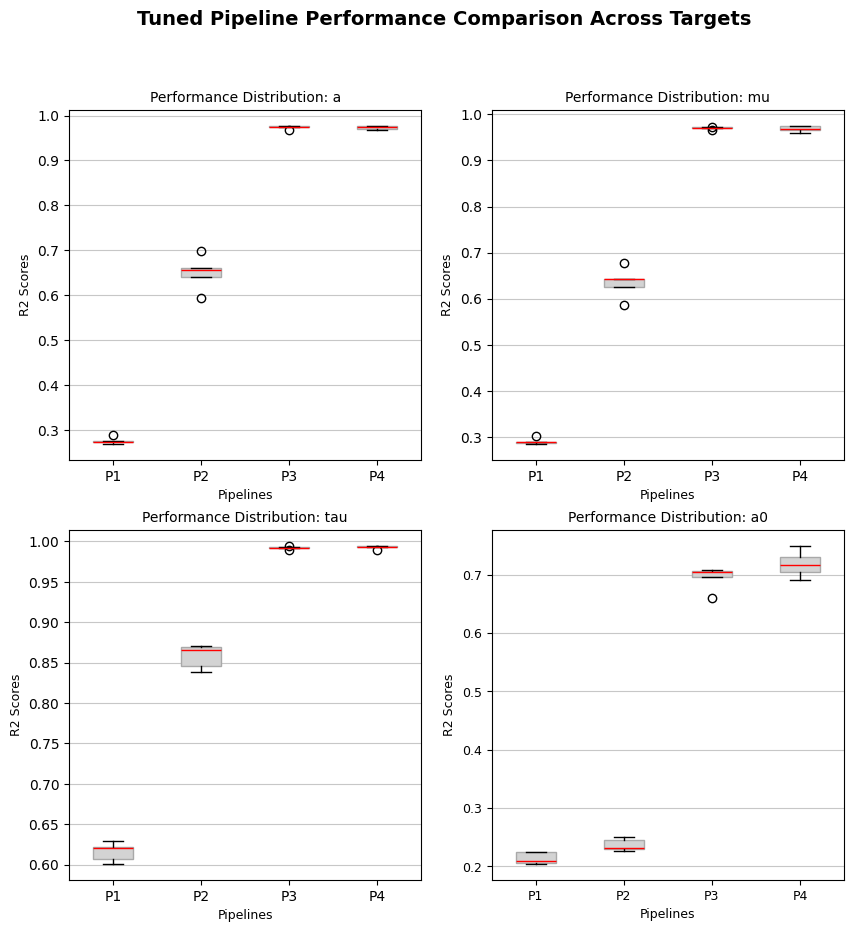

In [57]:
# 1. Setup Layout (2 rows x 2 cols)
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.flatten()

pipeline_names_short = ['P1', 'P2', 'P3', 'P4']

targets = ['a', 'mu', 'tau', 'a0']

# Dictionary to hold CV results
cv_results = dict()

# Loop per Target
for i, target_col in enumerate(targets):
    print(f"Processing target: {target_col}")
    ax = axes[i]
        
    # Get y data for this specific target
    y_target = y_train[target_col]
    
    # Container for scores
    cv_results_plot = []
    
    # Select appropriate tuned pipelines
    if target_col == 'a':
        list_of_pipelines = [a_pipeline_1_tuned, a_pipeline_2_tuned, 
                             a_pipeline_3_tuned, a_pipeline_4_tuned]
    elif target_col == 'mu':
        list_of_pipelines = [mu_pipeline_1_tuned, mu_pipeline_2_tuned, 
                             mu_pipeline_3_tuned, mu_pipeline_4_tuned]
    elif target_col == 'tau':
        list_of_pipelines = [tau_pipeline_1_tuned, tau_pipeline_2_tuned, 
                             tau_pipeline_3_tuned, tau_pipeline_4_tuned]
    elif target_col == 'a0':
        list_of_pipelines = [a0_pipeline_1_tuned, a0_pipeline_2_tuned, 
                             a0_pipeline_3_tuned, a0_pipeline_4_tuned]
        
    # Loop per Pipeline
    for idx, pipe in enumerate(list_of_pipelines):
        # Perform 5-Fold CV
        scores = cross_val_score(pipe, X_train, y_target, cv=5, scoring='r2', n_jobs=1)
        cv_results_plot.append(scores)
        
        # Store in dictionary
        cv_results[target_col+'_p'+str(idx+1)] = scores     
        
    # 3. Plot Boxplot
    bplot = ax.boxplot(cv_results_plot, tick_labels=pipeline_names_short, patch_artist=True, 
            boxprops=dict(facecolor='lightgrey', color='darkgrey'),
            medianprops=dict(color='red', linewidth=1))
        
    # Styling Plot
    ax.set_title(f'Performance Distribution: {target_col}', fontsize=10)
    ax.set_ylabel('R2 Scores', fontsize=9)
    ax.set_xlabel('Pipelines', fontsize=9)
    plt.yticks(fontsize=9)
    plt.xticks(fontsize=9)
    ax.grid(True, axis='y', linestyle='-', alpha=0.7)

# Main Title
plt.suptitle('Tuned Pipeline Performance Comparison Across Targets', fontsize=14, fontweight='bold')
plt.show()

#### 2. Actual vs Predicted (Scatter Plot)

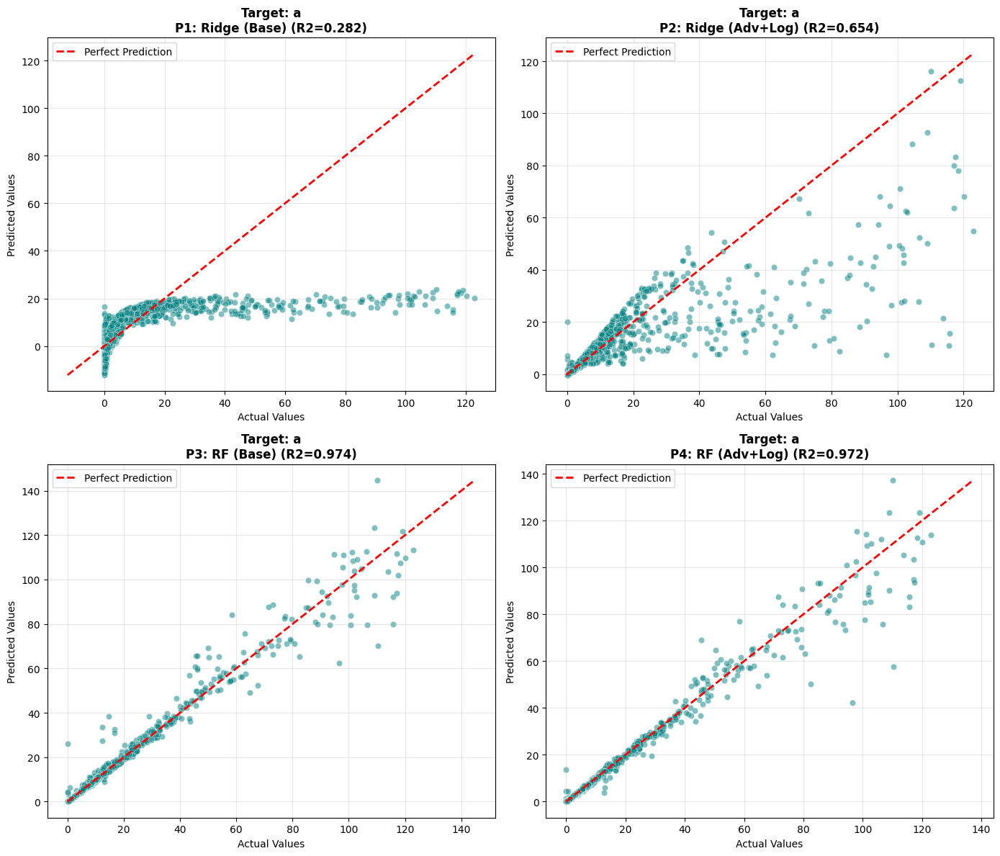

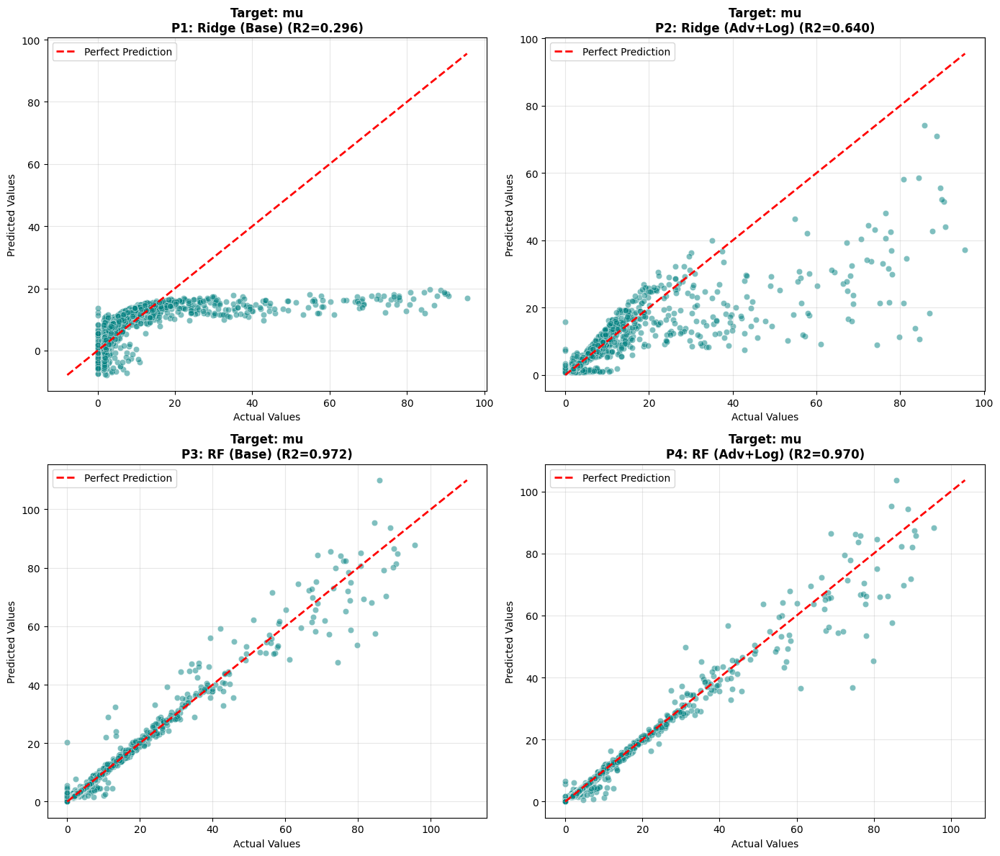

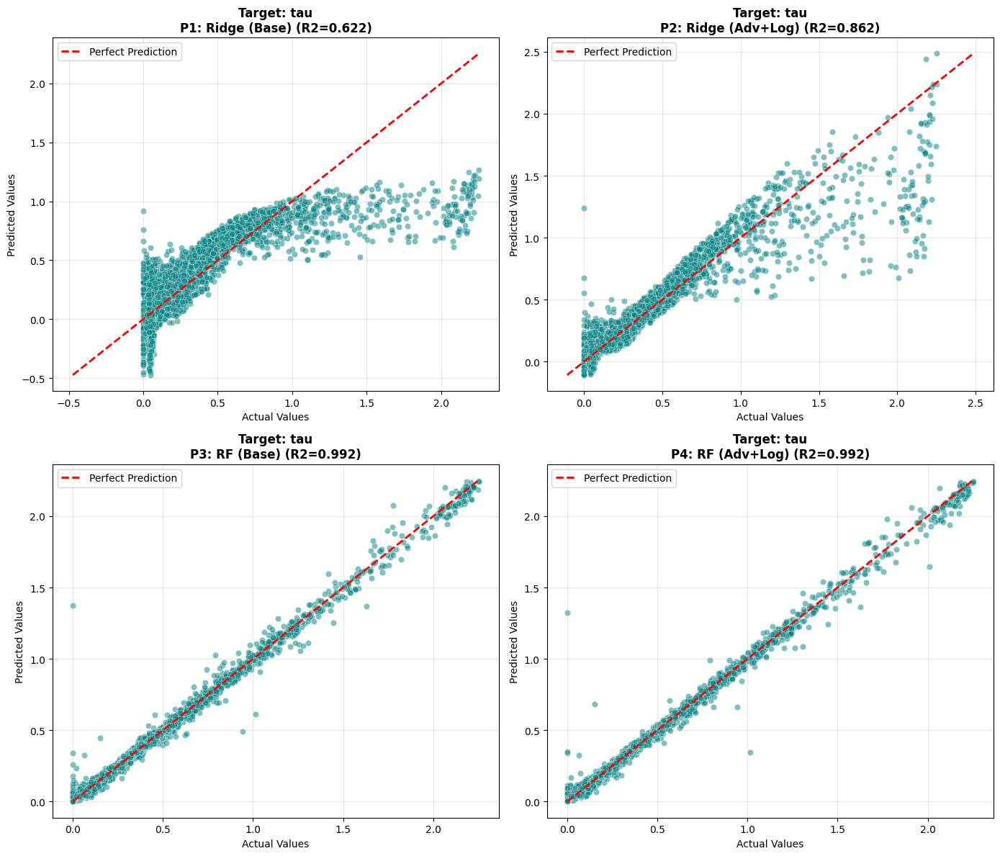

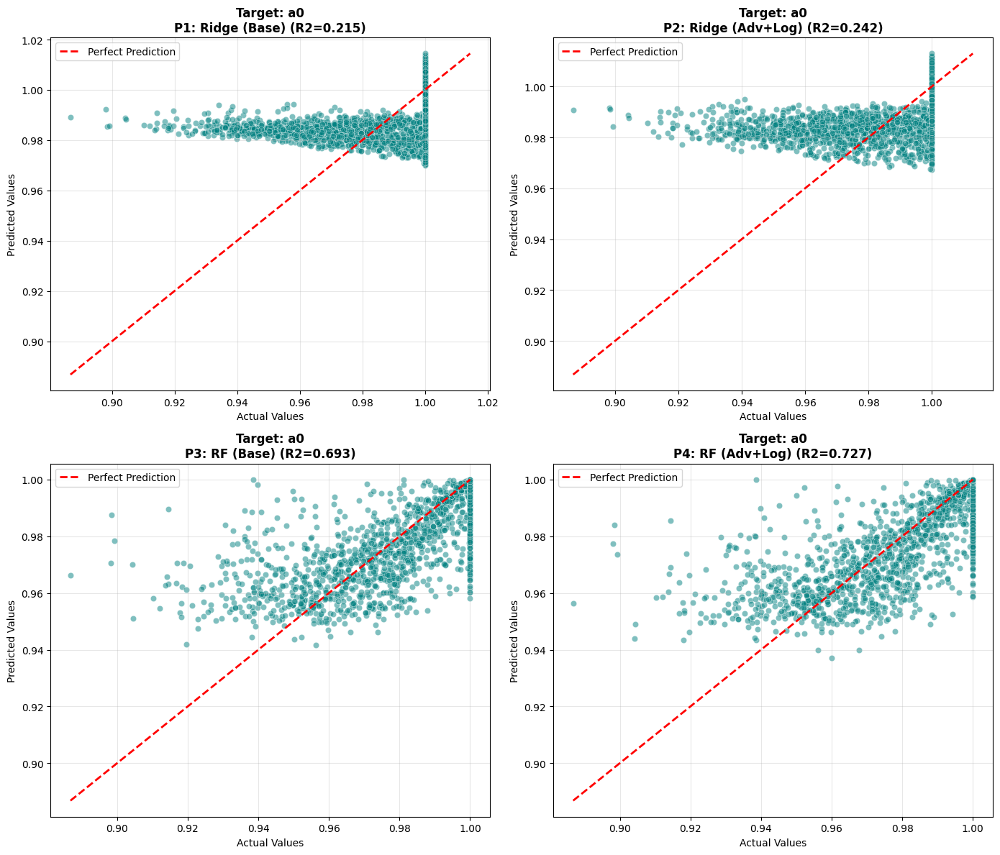

In [58]:
# Scatter Plots of Actual vs Predicted for each Target and Pipeline
target_cols = ['a', 'mu', 'tau', 'a0']
for target_col in target_cols:
    # Select appropriate tuned pipelines
    if target_col == 'a':
        list_of_pipelines = [a_pipeline_1_tuned, a_pipeline_2_tuned, 
                            a_pipeline_3_tuned, a_pipeline_4_tuned]
    elif target_col == 'mu':
        list_of_pipelines = [mu_pipeline_1_tuned, mu_pipeline_2_tuned, 
                            mu_pipeline_3_tuned, mu_pipeline_4_tuned]
    elif target_col == 'tau':
        list_of_pipelines = [tau_pipeline_1_tuned, tau_pipeline_2_tuned, 
                            tau_pipeline_3_tuned, tau_pipeline_4_tuned]
    elif target_col == 'a0':
        list_of_pipelines = [a0_pipeline_1_tuned, a0_pipeline_2_tuned, 
                            a0_pipeline_3_tuned, a0_pipeline_4_tuned]

    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    axes = axes.flatten()

    # Make plots for each pipeline
    for idx, pipe in enumerate(list_of_pipelines):
        
        # Get target column for train and test
        y_train_col = y_train[target_col]
        y_test_col = y_test[target_col]
        
        # Fit the pipeline on training data
        pipe.fit(X_train, y_train_col)
        
        # Predict on X_test
        y_pred = pipe.predict(X_test)

        # Calculate final R2 on test set
        final_r2 = r2_score(y_test_col, y_pred)
        
        # Plotting
        ax = axes[idx]
        
        # Scatter plot: X-axis = Actual Data, Y-axis = Predictions
        sns.scatterplot(x=y_test_col, y=y_pred, alpha=0.5, ax=ax, color='teal')
        
        # Plot ideal line (y=x)
        min_val = min(y_test_col.min(), y_pred.min())
        max_val = max(y_test_col.max(), y_pred.max())
        ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, label='Perfect Prediction')
        
        ax.set_title(f'Target: {target_col}\n{pipeline_names[idx]} (R2={final_r2:.3f})', fontsize=12, fontweight='bold')
        ax.set_xlabel('Actual Values')
        ax.set_ylabel('Predicted Values')
        ax.legend()
        ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

### **REPORT**

### **Comparative Regression Pipelines for Cyanobacteria Growth-Rate Parameters Prediction**

Name : Fauzi .
<br>Student ID : C5028673

#### **1 Introduction**

##### *1.1 Background*

In biological research, understanding the growth rate of bacteria under varying conditions is crucial for optimizing biotechnology. This study utilizes a dataset from cyanobacteria experiments to analyze how CO2, light availability, and sucrose efficiency influence the growth of bacteria. This dataset is then used to predict the four key growth parameters of cyanobacteria, including Maximum Number of Bacteria (`a`), Growth Rate (`mu`), Lag Phase (`tau`), and Initial Population (`a0`). Predicting these parameters allows researchers to simulate without time-consuming physical experiments.

##### *1.2 Objective*

The objective is to develop machine learning pipelines that can accurately map environmental variables (`n_cyanos`, `co2`, `light`, `SucRatio`) to the four growth parameters (`a`, `mu`, `tau`, `a0`).

##### *1.3 Challenges*

The dataset features and targets contain different units. Consequently, models may become biased toward variables with larger values.

#### **2 Exploratory Data Analysis (EDA)**

Before applying data preprocessing and modeling techniques, an Exploratory Data Analysis (EDA) was applied to understand the dataset's structure and identify quality issues.

##### *2.1 Data Overview*

The raw dataset (fitting-results.csv) had 19,992 observations and 9 variables. The initial review shows the dataset is complete with no null values. The Nsample feature is a unique experiment ID with 100% distinct values, so it was removed. The cleaned dataset had 19,992 rows and 8 columns, including four features (`n_cyanos`, `co2`, `light`, `SucRatio`) and four target variables (`a`, `mu`, `tau`, `a0`).

##### *2.2 Variable Analysis*

To understand the patterns and relationships, a detailed profile report and correlation analysis were conducted using pandas profiling. The analysis confirmed differences in scale between features. While the `co2` feature had a range from a minimum of 0.001 to a maximum of 100, `SucRatio` had a small range of 0 to 1. This variance in scale confirms the necessity of applying feature scaling (normalization) in the preprocessing stage.

<img src='graphs\figure1_correlation_heatmap_for_bacteria_dataset.png' title='Correlation Heatmap for Bacteria Dataset' width=500px/>

Figure 1: Correlation Heatmap for Bacteria Dataset (source: pandas-profiling)

On the other hand, as shown in Figure 1, high correlations were observed between `co2`, `n_cyanos`, `SucRatio`, and target variables. `co2` shows a strong positive correlation with `a` (0.599) and tau (0.581), indicating that CO2 availability is connected in some way. Moreover, `n_cyanos` has a strong negative correlation with the same target, suggesting an inverse relationship. Additionally, `SucRatio` exhibits a moderate negative correlation with the growth rate `mu` (-0.472). In contrast, the `light` feature shows near-zero linear correlation with all targets. This lack of linear correlation suggests that the relationship is likely non-linear.

#### **3 Methodology**

##### *3.1 Data Preparation and Preprocessing*

The dataset was split into three subsets: training set, validation set, and test set. Following the Monte Carlo cross-validation, this method is used to improve model performance and mitigate overfitting by creating random splits of the dataset into training and validation sets (Xu & Liang, 2001). The training set was used for model fitting and hyperparameter tuning via k-fold cross-validation. The validation used for benchmarking the initial performance of untuned models. The test set held out for the final evaluation of the tuned models.

Four target variables were predicted separately because they are correlated with each other. We removed the other target variables from the feature set when predicting one target. This step was crucial to prevent data leakage.

We addressed challenges from Section 2.2 on scale disparity and non-linearity through two preprocessing pipelines. We used StandardScaler to normalize the features to unit variance, referring to this as Basic Preprocessing. For Advanced Preprocessing, we used RobustScaler to reduce outliers. We then generated polynomial features to capture effects between environmental parameters (e.g., light and CO2). Finally, we applied log target transformation to convert target variables from an exponential to a linear scale.


##### *3.2 Machine Learning Pipelines*

Two families of algorithms were selected to test hypotheses regarding the structure of the data found in EDA. For the linear approach, we selected Ridge Regression as a baseline to capture the linear relationship between `co2`, `n_cyanos`, and the targets. It was employed to address multicollinearity, making it particularly suitable for analyzing complex biological data (Arashi et al., 2021).

On the other hand, non linear approach (Random Forest) was selected as second algorithms to model complex biological interactions. Specifically, while light conditions necessary for cyanobacterial photosynthesis (Papageorgiou & Govindjee 2014), preliminary analysis showed it lacks linear correlation with growth parameters. Random Forest (RF) was chosen specifically for its ability to model non linear relationships. This capability was highlighted by Nelson et al (2018) who utilized RF to analyze the biotic and abiotic factors influencing harmful algal blooms.

The four pipelines to test hypotheses regarding preprocessing and algorithm complexity are listed below:

1. Pipeline 1: StandardScaler + Ridge Regression.
2. Pipeline 2: PolyFeatures + RobustScaler + Ridge Regression + Log Target.
3. Pipeline 3: StandardScaler + Random Forest Regression.
4. Pipeline 4: PolyFeatures + RobustScaler + Random Forest Regression + Log Target.

##### *3.3 Hyperparameter Tuning*

Hyperparameter optimization was performed for each target using 5-Fold Cross-Validation to ensure a fair comparison. Pipeline 1 and 2 with Ridge Regression were tuned using GridSearchCV. Besides that, Pipelines with Random Forest Regression (Pipeline 3 and 4) were optimized for their parameters (`n_estimators`, `max_depth`, `min_samples_leaf`) using RandomSearchCV. For a more complex algorithm, Random Search required less computational cost compared to Grid Search. Moreover, this method yields an equivalent solution as good as Grid Search or even better in some cases (Bergstra & Bengio, 2012; Probst et al., 2019).

##### *3.4 Evaluation Metrics*

We utilized two quantitative metrics and a qualitative visual analysis to assess the predictive performance of the regression pipelines across the four target variables. Coefficient of Determination ($R^{2}$) selected for comparison. Since the four targets have different units and magnitudes, $R^{2}$ provides a normalized score (0 and 1) that allows for a fair comparison of model performance. Additionally, Root Mean Squared Error (RMSE) was used. While $R^{2}$ provides a normalized score, RMSE measures the error magnitude in the same physical units as the target variable. Finally, for visual analysis, scatter plots of actual vs predicted values were generated for the test set.

#### **4 Results and Discussion**

##### *4.1 Baseline Performance*

Before performing hyperparameter tuning, we evaluated the four pipelines using the validation set. This step served to benchmark the algorithms in their default condition.

Table 1: Baseline Performance on Validation Set (unptimized) 
| Pipeline | Target a (R2) | Target mu (R2) | Target tau (R2) | Target a0 (R2) |
| :--- | :--- | :--- | :--- | :--- |
| P1: Ridge (Basic) | 0.2782 | 0.2894 | 0.6270 | 0.2071 |
| P2: Ridge (Advanced) | 0.6797 | 0.6494 | 0.8727 | 0.2312 |
| P3: RF (Basic) | 0.9781 | 0.9752 | 0.9944 | 0.6907 |
| P4: RF (Advanced) | 0.9720 | 0.9715 | 0.9941 | 0.7066 |

The Random Forest models (P3 & P4) achieved near-perfect scores (${R^2}$ > 0.97) for the target `a`, `mu`, and `tau`. In contrast, the Linear models (P1) struggled significantly (${R^2}$ ~ 0.28), confirming early indications that the data relationship is nonlinear.

##### *4.2 Final Comparative Analysis*

The final optimized models were evaluated on the Test Set. As shown in Table 2, we utilized both $R^2$ and RMSE.

Table 2: Final Performance on Test Set (optimized)
| Pipeline | Target a (R2 / RMSE) | Target mu (R2 / RMSE) | Target tau (R2 / RMSE) | Target a0 (R2 / RMSE) |
| :--- | :--- | :--- | :--- | :--- |
| P1: Ridge (Basic) | 0.2823 / 11.6180 | 0.2960 / 8.4099 | 0.6218 / 0.2615 | 0.2148 / 0.0153 |
| P2: Ridge (Advanced) | 0.6539 / 8.0679 | 0.6399 / 6.0150 | 0.8620 / 0.1580 | 0.2418 / 0.0150 |
| P3: RF (Basic) | **0.9744 / 2.1963** | **0.9720 / 1.6776** | 0.9918 / 0.0386 | 0.6932 / 0.0095 |
| P4: RF (Advanced) | 0.9722 / 2.2868 | 0.9704 / 1.7251 | **0.9919 / 0.0383** | **0.7271 / 0.0090** |

As shown in Table 2, Random Forest models (P3 and P4) perform better than Ridge models. The best results for Target `a` and `mu` are performed by Pipeline 3 (Random Forest with Basic Preprocessing) with $R^2$ Score, 0.9744 and 0.9720. Moreover, Pipeline 4 (Random Forest with Advanced Preprocessing) performed best for predicting Target `tau` and `a0` with $R^2$ Score, 0.9919 and 0.7271. Ridge (P1) had the highest error of 11.6180 units. In contrast, Random Forest (P3) had the highest error of just 2.1963 units. The $R^2$ Score and RMSE demonstrate that non-linear models provide a better fit and higher precision.

Comparing Pipeline 1 and Pipeline 2, applying a Log Transformation significantly helped the Ridge Regression models. For Target `a` and `mu`, the $R^2$ Score increased more than twofold and the RMSE dropped more than 2 units. However, this is still far inferior to the Random Forest's performance. 

On the other hand, the Initial Population (`a0`) remained the hardest to predict, with the highest $R^2$ Score of 0.7271 across all pipelines. However, looking at the RMSE, the absolute error is very small (0.0090). This suggests that while the $R^2$ is lower, the actual predictive error is minimal and likely acceptable for practical applications.

<img src='graphs\figure2_performance_distribution_of_pipelines.png' title='Performance distribution of pipelines' width=500px/>

Figure 2: Performance distribution of pipelines.

##### *4.3 Visual Analysis*

<img src='graphs\figure3_scatter_plot_for_target_a.png' title='Scatter Plots for Target a' width=500px/>

Figure 3: Scatter Plots for Target a.

<img src='graphs\figure4_scatter_plot_for_target_mu.png' title='Scatter Plots for Target mu' width=500px/>

Figure 4: Scatter Plots for Target mu.

<img src='graphs\figure5_scatter_plot_for_target_tau.png' title='Scatter Plots for Target tau' width=500px/>

Figure 5: Scatter Plots for Target tau.

<img src='graphs\figure6_scatter_plot_for_target_a0.png' title='Scatter Plots for Target a0' width=500px/>

Figure 6: Scatter Plots for Target a0.

For targets `a`, `mu`, and `tau`, the points cluster along the diagonal y=x line. This indicates high precision and low bias. In contrast, the scatter plot for target `a0` shows a wider dispersion. This visually confirms the lower $R^2$ score and shows that the model struggles to capture variance in initial population sizes.

#### **5 Conclusion and Future Work**

##### *5.1 Conclusion*

This study successfully implemented regression frameworks to predict cyanobacteria growth parameters (`a`, `mu`, `tau`, `a0`) based on environmental features. The most significant finding is the big performance gap between Random Forest (P3 and P4) ($R^2$ > 0.97) and Ridge Regression (P1 and P2) ($R^2$ < 0.87). It confirms that features have complex and non-linear relationships with bacterial growth that linear models fail to capture, even with advanced preprocessing. 

The results showed that Pipeline 4 (Random Forest with Advanced Preprocessing) was the optimal model in this project. It achieved near-perfect prediction for Carrying Capacity (`a`) and Lag Phase (`tau`) with RMSE lower than 2.2 units. In contrast, while targets `a`, `mu`, and `tau` were highly predictable, the Initial Population (a0) showed the lowest $R^2$ score (0.7271). However, the RMSE for a0 was very low (0.0090).

##### *5.2 Future Work*

While Random Forest delivered high accuracy, the training time was significant. Future work could explore XGBoost or LightGBM as alternatives. These algorithms often provide comparable accuracy to Random Forest but with significantly faster training speeds.

#### **References**

Arashi, M., Roozbeh, M., Hamzah, N. A., & Gasparini, M. (2021). Ridge regression and its applications in genetic studies. Plos One, 16(4), e0245376. https://doi.org/10.1371/journal.pone.0245376

Bergstra, J., & Bengio, Y. (2012). Random search for hyper-parameter optimization. J. Mach. Learn. Res., 13(null), 281–305.

Nelson, N. G., Muñoz‐Carpena, R., Phli̇ps, E. J., Kaplan, D., Sucsy, P. V., & Hendrickson, J. (2018). Revealing Biotic and Abiotic Controls of Harmful Algal Blooms in a Shallow Subtropical Lake through Statistical Machine Learning. Environmental Science & Technology, 52(6), 3527-3535. https://doi.org/10.1021/acs.est.7b05884

Papageorgiou, G.C., Govindjee (2014). The Non-Photochemical Quenching of the Electronically Excited State of Chlorophyll a in Plants: Definitions, Timelines, Viewpoints, Open Questions. In: Demmig-Adams, B., Garab, G., Adams III, W., Govindjee, . (eds) Non-Photochemical Quenching and Energy Dissipation in Plants, Algae and Cyanobacteria. Advances in Photosynthesis and Respiration, vol 40. Springer, Dordrecht. https://doi.org/10.1007/978-94-017-9032-1_1

Probst, P., Wright, M. N., & Boulesteix, A. (2019). Hyperparameters and tuning strategies for random forest. WIREs Data Mining and Knowledge Discovery, 9(3). https://doi.org/10.1002/widm.1301

Xu, Q. and Liang, Y. (2001). Monte Carlo cross validation. Chemometrics and Intelligent Laboratory Systems, 56(1), 1-11. https://doi.org/10.1016/s0169-7439(00)00122-2





